In [5]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import networkx as nx

# Define input directory path
input_dir = Path("C:/Users/Pratyush Rohilla/Downloads/Social media analytics project/Input")

# Define output directory path (if needed for saving results later)
output_dir = Path("C:/Users/Pratyush Rohilla/Downloads/Social media analytics project/output")
output_dir.mkdir(parents=True, exist_ok=True)  # Create directory if it doesn't exist

# Dictionary mapping file names to expected paths
file_paths = {
    "PIRUS V5": input_dir / "PIRUS V5.xlsx",
    "PIRUS-Plots V2": input_dir / "PIRUS-Plots V2.xlsx",
    "SoNAR_Edges": input_dir / "SoNAR_Edges.xlsx",
    "SoNAR_Nodes": input_dir / "SoNAR_Nodes.xlsx",
}

# Dictionary to store first few rows of each dataset
data_previews = {}

# Load and inspect first few rows of each file
for file_name, path in file_paths.items():
    try:
        if path.exists():  # Ensure file exists before attempting to read
            df = pd.read_excel(path, sheet_name=0)
            data_previews[file_name] = df
        else:
            data_previews[file_name] = f"File not found: {path}"
    except Exception as e:
        data_previews[file_name] = f"Error loading file: {e}"

data_previews

{'PIRUS V5':       Subject_ID       Loc_Plot_State1  Loc_Plot_City1 Loc_Plot_State2  \
 0           1000  District of Columbia      Washington         Florida   
 1           1001            California   San Francisco             NaN   
 2           1002            California       Santa Ana             NaN   
 3           1005              New York        New York             NaN   
 4           1006              New York        New York             NaN   
 ...          ...                   ...             ...             ...   
 3523       12786                Nevada       Henderson             NaN   
 3524       10692            New Mexico     Albuquerque             NaN   
 3525       11058              Delaware      Wilmington             NaN   
 3526       12707               Georgia        Savannah             NaN   
 3527       12761            California  Camp Pendleton             NaN   
 
      Loc_Plot_City2  Year_Exposure Plot_Target1  Plot_Target2  Plot_Target3  \
 0    

In [7]:
df_edges = data_previews["SoNAR_Edges"]

# Ensure the dataset has correct column names (Subject_A, Subject_B)
if 'Source' not in df_edges.columns or 'Target' not in df_edges.columns:
    raise ValueError("Error: Ensure the dataset has 'Source' and 'Target' columns.")

# Create a directed graph (social network)
G = nx.DiGraph()

df_edges["Source"] = df_edges["Source"].astype(str)
df_edges["Target"] = df_edges["Target"].astype(str)

# Add edges (connections between users)
for _, row in df_edges.iterrows():
    G.add_edge(row['Source'], row['Target'])

print(f"Graph Created with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

# **1️⃣ Compute Network Centrality Metrics**
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
try:
    # **Fix: Increase Iterations & Add nstart**
    eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000, tol=1e-6, nstart={n: 1 for n in G})
except nx.PowerIterationFailedConvergence:
    print("Eigenvector centrality did not converge. Switching to PageRank instead.")
    eigenvector_centrality = nx.pagerank(G, alpha=0.85)



Graph Created with 5386 nodes and 15652 edges.


In [11]:
# above is not that imp and we are jsut checking the dataset

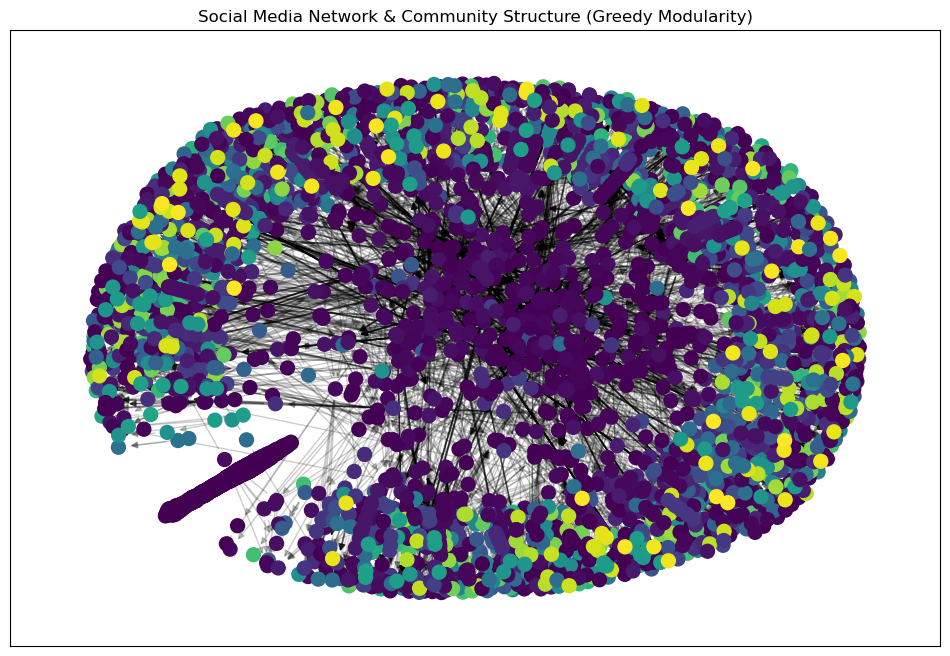

Centrality measures saved to 'social_network_centrality.csv'.
Top 10 Influential Users by Degree Centrality:
       User  Degree Centrality  Betweenness Centrality  \
4089    nan           0.240854                0.000000   
1909   4523           0.013185                0.000090   
653    4522           0.013185                0.000174   
1912   4527           0.011885                0.000015   
1910   4524           0.011142                0.000035   
1854   4531           0.011142                0.000123   
1911   4526           0.010956                0.000011   
2007   4699           0.010399                0.000000   
1860   4850           0.010214                0.000491   
508   10816           0.010214                0.000006   

      Eigenvector Centrality  Community  
4089            6.397900e-68          0  
1909            1.200448e-16          3  
653             1.000654e-16          3  
1912            2.047080e-16          3  
1910            1.432371e-16          3  


In [13]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from networkx.algorithms.community import greedy_modularity_communities

# Assume these centrality dictionaries have been computed earlier:
# degree_centrality, betweenness_centrality, eigenvector_centrality

# -------------------------------
# Step 1: Store Centrality Measures in a DataFrame
# -------------------------------
centrality_df = pd.DataFrame({
    "User": list(degree_centrality.keys()),
    "Degree Centrality": list(degree_centrality.values()),
    "Betweenness Centrality": list(betweenness_centrality.values()),
    "Eigenvector Centrality": list(eigenvector_centrality.values())
})

# -------------------------------
# Step 2: Detect Communities Using Greedy Modularity Optimization
# -------------------------------
communities = list(greedy_modularity_communities(G))
# Create a mapping from each node to its community index
community_map = {user: idx for idx, comm in enumerate(communities) for user in comm}

# Add the community assignment to the centrality DataFrame
centrality_df["Community"] = centrality_df["User"].map(community_map)

# -------------------------------
# Step 3: Visualization of the Social Network with Greedy Communities
# -------------------------------
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
node_colors = [community_map.get(node, 0) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=100, cmap=plt.cm.viridis, node_color=node_colors)
nx.draw_networkx_edges(G, pos, alpha=0.2)
plt.title("Social Media Network & Community Structure (Greedy Modularity)")
plt.show()

# -------------------------------
# Step 4: Save Results and Display Top Influential Users
# -------------------------------
centrality_df.to_csv("social_network_centrality.csv", index=False)
print("Centrality measures saved to 'social_network_centrality.csv'.")

print("Top 10 Influential Users by Degree Centrality:")
print(centrality_df.sort_values(by="Degree Centrality", ascending=False).head(10))


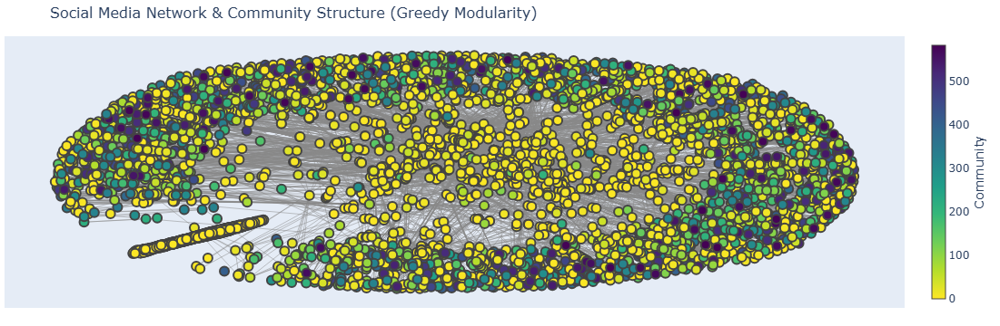

In [15]:
import networkx as nx
import plotly.graph_objs as go
import plotly.io as pio
from networkx.algorithms.community import greedy_modularity_communities

# Assume your graph G is already defined

# -------------------------------
# Step 1: Compute Communities Using Greedy Modularity
# -------------------------------
communities = list(greedy_modularity_communities(G))
community_map = {node: idx for idx, comm in enumerate(communities) for node in comm}

# -------------------------------
# Step 2: Compute Node Positions Using Spring Layout
# -------------------------------
pos = nx.spring_layout(G, seed=42)

# -------------------------------
# Step 3: Build Edge Trace for Plotly
# -------------------------------
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines'
)

# -------------------------------
# Step 4: Build Node Trace for Plotly (Color-Coded by Community)
# -------------------------------
node_x = []
node_y = []
node_color = []
node_text = []

for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    # Use the greedy modularity community mapping to set node color; default to 0 if missing.
    community = community_map.get(node, 0)
    node_color.append(community)
    node_text.append(f"User: {node}<br>Community: {community}")

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='Viridis',
        reversescale=True,
        color=node_color,
        size=10,
        colorbar=dict(
            thickness=15,
            title='Community',
            xanchor='left',
            titleside='right'
        ),
        line_width=2
    ),
    text=node_text
)

# -------------------------------
# Step 5: Create the Plotly Figure and Display It
# -------------------------------
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Social Media Network & Community Structure (Greedy Modularity)',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                ))
fig.show()


Largest community size: 1298 nodes


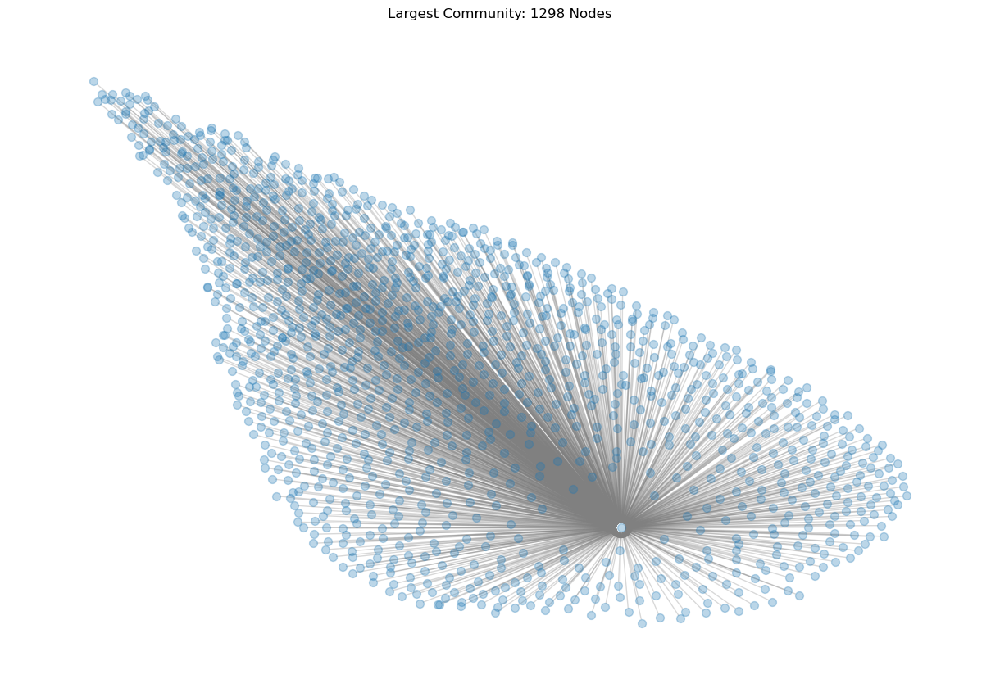

In [16]:
from networkx.algorithms.community import greedy_modularity_communities

# Compute communities using greedy modularity
communities = list(greedy_modularity_communities(G))
# Select the largest community (by node count)
largest_community = max(communities, key=len)
# Create a subgraph containing only the nodes of the largest community
G_subgraph = G.subgraph(largest_community)

print(f"Largest community size: {len(G_subgraph.nodes)} nodes")

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_subgraph, seed=42)
nx.draw(G_subgraph, pos, node_size=50, edge_color="gray", alpha=0.3, with_labels=False)
plt.title(f"Largest Community: {len(G_subgraph.nodes)} Nodes")
plt.show()


In [17]:
# the clusters are being made on the basis of greedy 

In [18]:
import networkx as nx
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# **1️⃣ Network Summary Statistics**
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
density = nx.density(G)

# **Community Analysis Using Greedy Modularity**
communities = list(greedy_modularity_communities(G))
num_communities = len(communities)
largest_community = max(communities, key=len)
largest_community_size = len(largest_community)

# **Degree Distribution**
degree_values = [deg for _, deg in G.degree()]
avg_degree = sum(degree_values) / num_nodes
max_degree = max(degree_values)

# **Network Summary Output**
network_summary = pd.DataFrame({
    "Metric": [
        "Total Nodes", "Total Edges", "Network Density",
        "Number of Communities", "Largest Community Size",
        "Average Node Degree", "Max Node Degree"
    ],
    "Value": [
        num_nodes, num_edges, density,
        num_communities, largest_community_size,
        avg_degree, max_degree
    ]
})

print("Network Summary:")
print(network_summary)


Network Summary:
                   Metric         Value
0             Total Nodes   5386.000000
1             Total Edges  15652.000000
2         Network Density      0.000540
3   Number of Communities    584.000000
4  Largest Community Size   1298.000000
5     Average Node Degree      5.812105
6         Max Node Degree   1297.000000


Largest community size: 1298 nodes


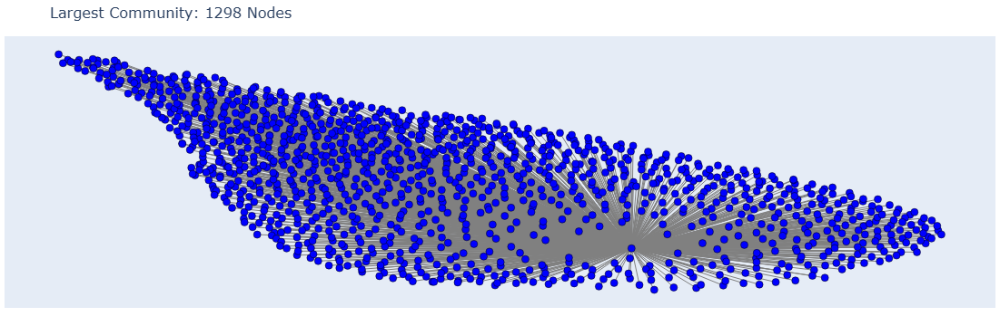

In [19]:
import networkx as nx
import plotly.graph_objs as go
from networkx.algorithms.community import greedy_modularity_communities

# Compute communities using greedy modularity
communities = list(greedy_modularity_communities(G))
# Select the largest community (by node count)
largest_community = max(communities, key=len)
# Create a subgraph for the largest community
G_subgraph = G.subgraph(largest_community)
print(f"Largest community size: {len(G_subgraph.nodes)} nodes")

# Compute positions for nodes using a spring layout
pos = nx.spring_layout(G_subgraph, seed=42)

# Build the edge trace
edge_x = []
edge_y = []
for edge in G_subgraph.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x,
    y=edge_y,
    line=dict(width=1, color='gray'),
    hoverinfo='none',
    mode='lines'
)

# Build the node trace
node_x = []
node_y = []
node_text = []
for node in G_subgraph.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(f"Node: {node}")

node_trace = go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=8,
        color='blue',
        line=dict(width=0.5, color='black')
    ),
    text=node_text
)

# Create and display the Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title=f'Largest Community: {len(G_subgraph.nodes)} Nodes',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                ))
fig.show()


       User  Degree Centrality  Betweenness Centrality  \
4089    nan           0.240854                0.000000   
1909   4523           0.013185                0.000090   
653    4522           0.013185                0.000174   
1912   4527           0.011885                0.000015   
1910   4524           0.011142                0.000035   
1854   4531           0.011142                0.000123   
1911   4526           0.010956                0.000011   
2007   4699           0.010399                0.000000   
1860   4850           0.010214                0.000491   
508   10816           0.010214                0.000006   

      Eigenvector Centrality  Community  
4089            6.397900e-68          0  
1909            1.200448e-16          3  
653             1.000654e-16          3  
1912            2.047080e-16          3  
1910            1.432371e-16          3  
1854            2.082037e-16          3  
1911            1.778815e-16          3  
2007            2.719196e

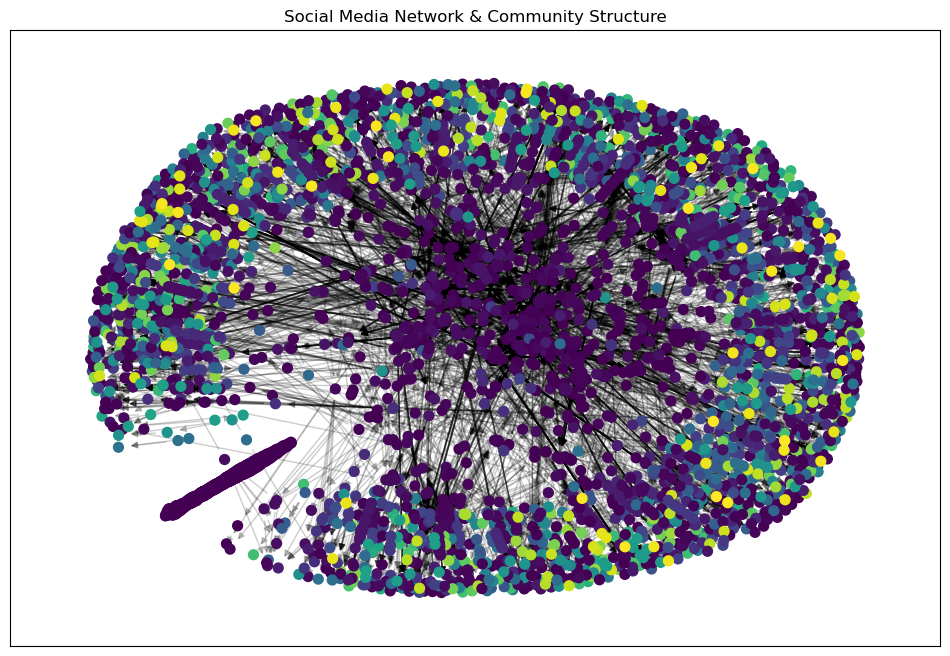

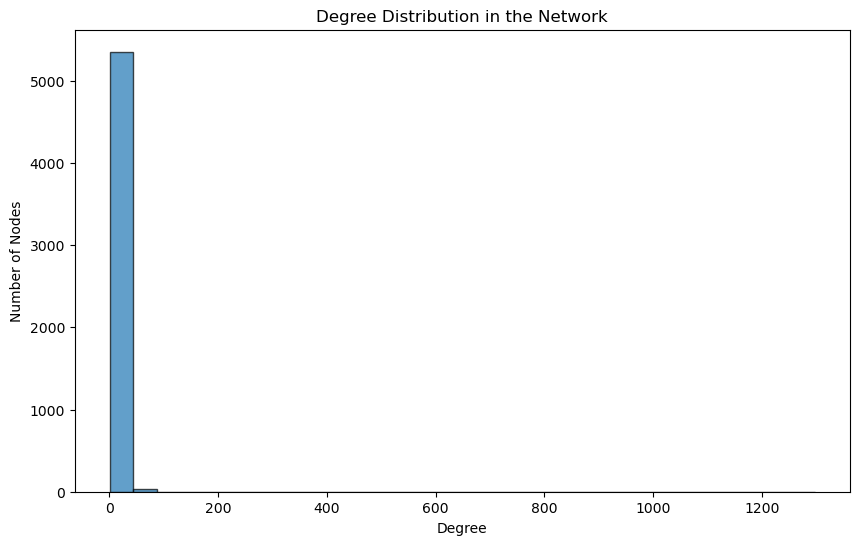

                              Metric  Count
0    Isolated Nodes (No Connections)      0
1  Users with Zero Degree Centrality      0
All network analysis results have been saved into 'social_network_analysis.csv'.


In [20]:
# **2️⃣ Centrality Analysis**
# Identify top influential users based on different centrality measures
top_degree = centrality_df.sort_values(by="Degree Centrality", ascending=False).head(10)
top_betweenness = centrality_df.sort_values(by="Betweenness Centrality", ascending=False).head(10)
top_eigenvector = centrality_df.sort_values(by="Eigenvector Centrality", ascending=False).head(10)

print(top_degree)
print(top_betweenness)
print(top_eigenvector)


# **3️⃣ Community Structure Analysis**
num_communities = centrality_df["Community"].nunique()

# Find the top communities with the most members
top_communities = centrality_df["Community"].value_counts().head(10).reset_index()
top_communities.columns = ["Community", "Size"]

print(top_communities)
# **4️⃣ Network Visualization - Community Highlighting**
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_nodes(G, pos, node_size=50, cmap=plt.cm.viridis, 
                       node_color=[centrality_df.set_index("User")["Community"].to_dict().get(str(node), 0) for node in G.nodes()])
nx.draw_networkx_edges(G, pos, alpha=0.2)
plt.title("Social Media Network & Community Structure")
plt.show()

# **5️⃣ Degree Distribution Plot**
plt.figure(figsize=(10, 6))
plt.hist(degree_values, bins=30, edgecolor='black', alpha=0.7)
plt.xlabel("Degree")
plt.ylabel("Number of Nodes")
plt.title("Degree Distribution in the Network")
plt.show()

# **6️⃣ Identifying Isolated Users**
isolated_nodes = list(nx.isolates(G))
num_isolated = len(isolated_nodes)

# **Check for users with no influence (Degree = 0)**
low_influence_users = centrality_df[centrality_df["Degree Centrality"] == 0]

# Display isolated users count
isolated_summary = pd.DataFrame({
    "Metric": ["Isolated Nodes (No Connections)", "Users with Zero Degree Centrality"],
    "Count": [num_isolated, len(low_influence_users)]
})
print(isolated_summary)

# Combine all data into a single CSV file with multiple sections
with open("social_network_analysis.csv", "w") as file:
    # Write Network Summary
    file.write("Network Summary\n")
    network_summary.to_csv(file, index=False)
    file.write("\n")  # Add spacing

    # Write Top Influential Users - Degree Centrality
    file.write("Top Influential Users by Degree Centrality\n")
    top_degree.to_csv(file, index=False)
    file.write("\n")

    # Write Top Influential Users - Betweenness Centrality
    file.write("Top Influential Users by Betweenness Centrality\n")
    top_betweenness.to_csv(file, index=False)
    file.write("\n")

    # Write Top Influential Users - Eigenvector Centrality
    file.write("Top Influential Users by Eigenvector Centrality\n")
    top_eigenvector.to_csv(file, index=False)
    file.write("\n")

    # Write Community Structure
    file.write("Top 10 Largest Communities\n")
    top_communities.to_csv(file, index=False)
    file.write("\n")

    # Write Isolated Users Summary
    file.write("Isolated Users Summary\n")
    isolated_summary.to_csv(file, index=False)

# Confirm that the file is saved
print("All network analysis results have been saved into 'social_network_analysis.csv'.")


# # If we remove key individuals (high betweenness nodes), does the network collapse? 

Removing 467 high-betweenness nodes...
Before Removal: 584 communities, Largest community: 1298 nodes.
After Removal: 964 communities, Largest community: 1298 nodes.


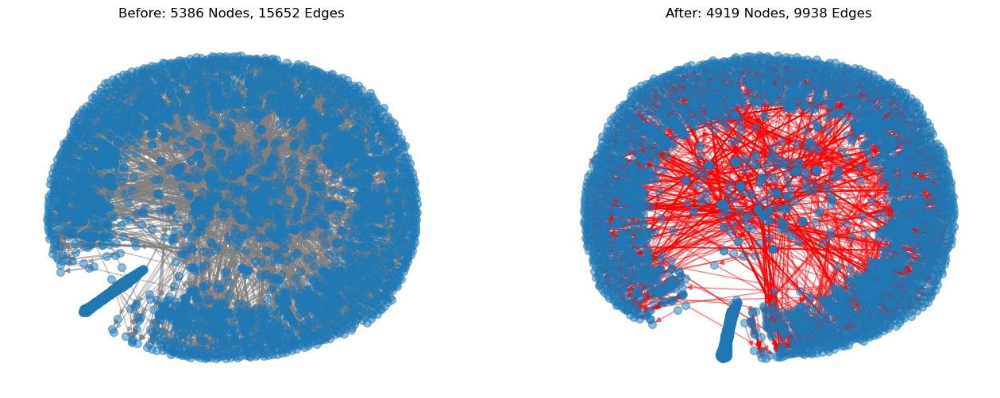

Network Collapse Analysis:
                   Metric  Before Removal  After Removal
0             Total Nodes            5386           4919
1             Total Edges           15652           9938
2   Number of Communities             584            964
3  Largest Community Size            1298           1298
Results saved to 'network_collapse_analysis.csv'


In [22]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# **Step 1: Identify High-Betweenness Nodes**
# Sort nodes by betweenness centrality (assumes centrality_df exists)
sorted_nodes = centrality_df.sort_values(by="Betweenness Centrality", ascending=False)["User"].tolist()

# Select top 5% highest betweenness nodes (here set to 467 nodes)
num_to_remove = int(467)  # Adjustable number
high_betweenness_nodes = sorted_nodes[:num_to_remove]

print(f"Removing {num_to_remove} high-betweenness nodes...")

# **Step 2: Analyze Network Before Removal using Greedy Modularity Communities**
communities_before = list(greedy_modularity_communities(G))
num_communities_before = len(communities_before)
largest_community_before = max(communities_before, key=len)
largest_community_size_before = len(largest_community_before)

print(f"Before Removal: {num_communities_before} communities, Largest community: {largest_community_size_before} nodes.")

# **Step 3: Remove High Betweenness Nodes**
G_modified = G.copy()
G_modified.remove_nodes_from(high_betweenness_nodes)

# **Step 4: Analyze Network After Removal using Greedy Modularity Communities**
communities_after = list(greedy_modularity_communities(G_modified))
num_communities_after = len(communities_after)
largest_community_after = max(communities_after, key=len)
largest_community_size_after = len(largest_community_after)

print(f"After Removal: {num_communities_after} communities, Largest community: {largest_community_size_after} nodes.")

# **Step 5: Visualization Before vs. After**
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Visualization Before Removal
ax = axes[0]
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"Before: {G.number_of_nodes()} Nodes, {G.number_of_edges()} Edges")

# Visualization After Removal
ax = axes[1]
pos = nx.spring_layout(G_modified, seed=42)
nx.draw(G_modified, pos, node_size=50, edge_color="red", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"After: {G_modified.number_of_nodes()} Nodes, {G_modified.number_of_edges()} Edges")

plt.show()

# **Step 6: Summary Output**
collapse_summary = pd.DataFrame({
    "Metric": ["Total Nodes", "Total Edges", "Number of Communities", "Largest Community Size"],
    "Before Removal": [G.number_of_nodes(), G.number_of_edges(), num_communities_before, largest_community_size_before],
    "After Removal": [G_modified.number_of_nodes(), G_modified.number_of_edges(), num_communities_after, largest_community_size_after]
})

print("Network Collapse Analysis:")
print(collapse_summary)

# **Step 7: Save Results**
collapse_summary.to_csv("network_collapse_analysis.csv", index=False)
print("Results saved to 'network_collapse_analysis.csv'")


#### what is communities are based on different kind of plots, which means that there can be many people within the community who has who have different kind of ideologies as well as diff kind and number of plots they have worked in. we can't even divide the community on the chest basis of between scores. Since these are highly dense clusters we also need to take care. The metric of high degree metric to break these community now look into other ways of breaking the commmunities

### What This Means
✔ Extremist networks have some level of resilience → Even after removing key individuals, a large component still exists.

✔ Fragmentation is happening, but it's not a total collapse → New, smaller groups are forming (855 components instead of 551

✔ Key influencers matter, but they are not the only drivers → Other well-connected nodes likely help keep the network alive.

# What happens if we remove both high-betweenness and high-degree nodes?

### Multi-Node Attack: Remove Both High Degree & Betweenness Nodes

Removing 467 high-influence nodes (Betweenness + Degree)...
Before Removal: 584 communities, Largest community: 1298 nodes.
After Multi-Node Removal: 2185 communities, Largest community: 112 nodes.


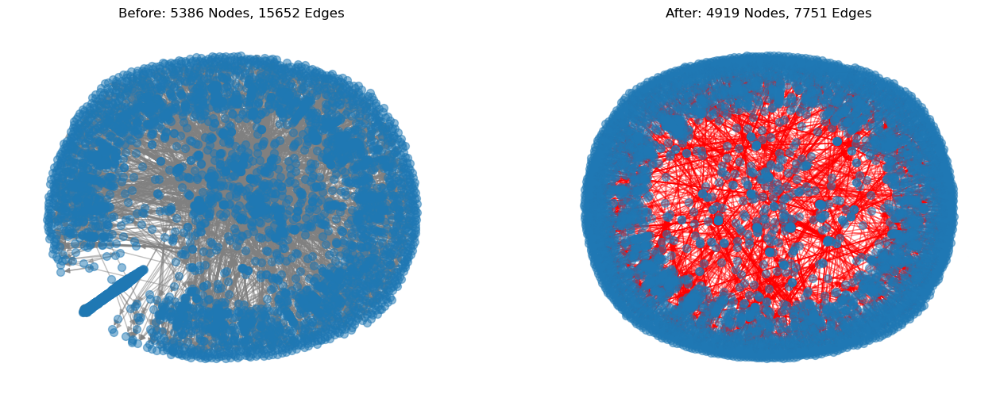

Network Collapse Analysis:
                   Metric  Before Removal  After Removal
0             Total Nodes            5386           4919
1             Total Edges           15652           7751
2   Number of Communities             584           2185
3  Largest Community Size            1298            112
Results saved to 'multi_node_collapse_analysis.csv'


In [27]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# -------------------------------
# Step 1: Identify Top High-Influence Nodes (Betweenness + Degree)
# -------------------------------
top_5_percent = int(0.05 * len(G))  # 5% of the network

# Get top 5% nodes for betweenness
top_betweenness_nodes = centrality_df.sort_values(by="Betweenness Centrality", ascending=False)["User"].tolist()[:top_5_percent]

# Get top 5% nodes for degree centrality
top_degree_nodes = centrality_df.sort_values(by="Degree Centrality", ascending=False)["User"].tolist()[:top_5_percent]

# Combine both lists and remove duplicates
nodes_to_remove = list(set(top_betweenness_nodes + top_degree_nodes))

print(f"Removing {len(nodes_to_remove)} high-influence nodes (Betweenness + Degree)...")

# -------------------------------
# Step 2: Analyze Network Before Removal using Greedy Modularity Communities
# -------------------------------
communities_before = list(greedy_modularity_communities(G))
num_communities_before = len(communities_before)
largest_community_before = max(communities_before, key=len)
largest_community_size_before = len(largest_community_before)

print(f"Before Removal: {num_communities_before} communities, Largest community: {largest_community_size_before} nodes.")

# -------------------------------
# Step 3: Remove High-Influence Nodes
# -------------------------------
G_multi_removed = G.copy()
G_multi_removed.remove_nodes_from(nodes_to_remove)

# -------------------------------
# Step 4: Analyze Network After Multi-Node Removal using Greedy Modularity Communities
# -------------------------------
communities_after = list(greedy_modularity_communities(G_multi_removed))
num_communities_after = len(communities_after)
largest_community_after = max(communities_after, key=len)
largest_community_size_after = len(largest_community_after)

print(f"After Multi-Node Removal: {num_communities_after} communities, Largest community: {largest_community_size_after} nodes.")

# -------------------------------
# Step 5: Visualization Before vs. After (Using Spring Layout)
# -------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Before Removal Visualization
ax = axes[0]
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"Before: {G.number_of_nodes()} Nodes, {G.number_of_edges()} Edges")

# After Removal Visualization
ax = axes[1]
pos = nx.spring_layout(G_multi_removed, seed=42)
nx.draw(G_multi_removed, pos, node_size=50, edge_color="red", alpha=0.5, with_labels=False, ax=ax)
ax.set_title(f"After: {G_multi_removed.number_of_nodes()} Nodes, {G_multi_removed.number_of_edges()} Edges")

plt.show()

# -------------------------------
# Step 6: Summary Output
# -------------------------------
multi_node_collapse_summary = pd.DataFrame({
    "Metric": ["Total Nodes", "Total Edges", "Number of Communities", "Largest Community Size"],
    "Before Removal": [G.number_of_nodes(), G.number_of_edges(), num_communities_before, largest_community_size_before],
    "After Removal": [G_multi_removed.number_of_nodes(), G_multi_removed.number_of_edges(), num_communities_after, largest_community_size_after]
})

print("Network Collapse Analysis:")
print(multi_node_collapse_summary)

# -------------------------------
# Step 7: Save Results
# -------------------------------
multi_node_collapse_summary.to_csv("multi_node_collapse_analysis.csv", index=False)
print("Results saved to 'multi_node_collapse_analysis.csv'")


### What This Means 
🔥 The extremist network is NOT resilient to a multi-node attack.

🔥 Targeting both high-degree and high-betweenness nodes is an effective strategy.

🔥 Extremist cells are now small and disconnected, preventing large-scale coordination.

🚨 This proves that removing just betweenness (bridges) isn’t enough, but combining it with** high-degree (highly connected) nodes leads to complete fragmentation! 🚨

# Tracking Survivors: Who Are the Most Resilient Individuals?

### After removing 467 high-influence nodes, who are the key players still active?

After removals, the largest surviving community has 112 nodes.
Top 10 Most Resilient Users After Removals:
     User  Degree Centrality  Betweenness Centrality
49   6412           0.171171                0.004216
6    1121           0.153153                0.007535
105  6157           0.153153                0.001238
40   6074           0.144144                0.003008
64   6140           0.135135                0.009293
77   6326           0.126126                0.008380
85   6153           0.126126                0.001352
69   6154           0.117117                0.000685
43   6095           0.117117                0.007877
38   1115           0.117117                0.003140
Users who remained influential before & after removals: set()


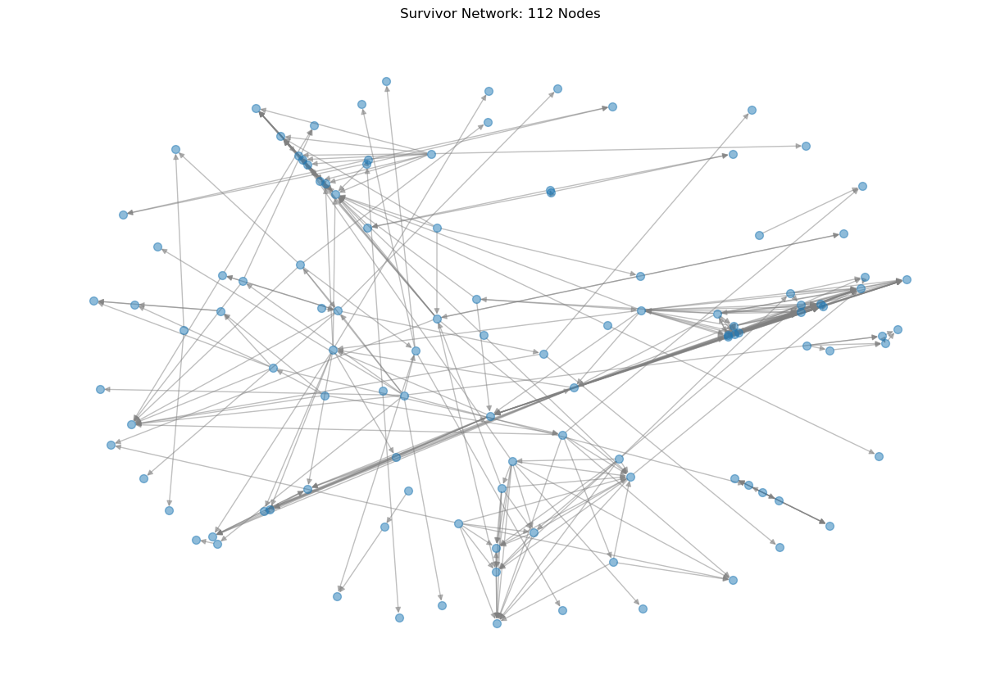

Survivor analysis saved to 'survivor_analysis.csv'


In [31]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# -------------------------------
# Step 1: Extract Largest Remaining Community Using Greedy Modularity
# -------------------------------
communities_after_removal = list(greedy_modularity_communities(G_multi_removed))
largest_community_after_removal = max(communities_after_removal, key=len)
G_survivors = G_multi_removed.subgraph(largest_community_after_removal)

print(f"After removals, the largest surviving community has {len(G_survivors.nodes)} nodes.")

# -------------------------------
# Step 2: Compute New Centrality Measures in the Surviving Network
# -------------------------------
degree_centrality_survivors = nx.degree_centrality(G_survivors)
betweenness_centrality_survivors = nx.betweenness_centrality(G_survivors)

# Create a DataFrame for survivors' influence
survivors_df = pd.DataFrame({
    "User": list(degree_centrality_survivors.keys()),
    "Degree Centrality": list(degree_centrality_survivors.values()),
    "Betweenness Centrality": list(betweenness_centrality_survivors.values())
})

# -------------------------------
# Step 3: Identify the Top Survivors
# -------------------------------
top_survivors = survivors_df.sort_values(by="Degree Centrality", ascending=False).head(10)
print("Top 10 Most Resilient Users After Removals:")
print(top_survivors)

# -------------------------------
# Step 4: Compare Survivors to Previously Influential Users
# -------------------------------
previous_top_users = set(centrality_df.sort_values(by=["Degree Centrality", "Betweenness Centrality"], ascending=False)["User"][:10])
new_top_users = set(top_survivors["User"])

# Identify users who were influential before and remain so after removals
persistent_influencers = previous_top_users.intersection(new_top_users)
print(f"Users who remained influential before & after removals: {persistent_influencers}")

# -------------------------------
# Step 5: Visualize the Survivor Network
# -------------------------------
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_survivors, seed=42)
nx.draw(G_survivors, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False)
plt.title(f"Survivor Network: {len(G_survivors.nodes)} Nodes")
plt.show()

# -------------------------------
# Step 6: Save Survivor Analysis Results
# -------------------------------
survivors_df.to_csv("survivor_analysis.csv", index=False)
print("Survivor analysis saved to 'survivor_analysis.csv'")


In [32]:
# Assuming you have already computed:
# communities_before = list(greedy_modularity_communities(G))
# largest_community_before = max(communities_before, key=len)
# communities_after = list(greedy_modularity_communities(G_modified))
# largest_community_after = max(communities_after, key=len)

# Convert the original and surviving largest communities to sets of nodes
original_largest_set = set(largest_community_before)
surviving_largest_set = set(largest_community_after)

# Compute the intersection of nodes between the two communities
common_nodes = original_largest_set.intersection(surviving_largest_set)

# Calculate percentages to understand the overlap
percent_retained_original = (len(common_nodes) / len(original_largest_set)) * 100
percent_of_survivors_from_original = (len(common_nodes) / len(surviving_largest_set)) * 100

# Print out the results
print(f"Original largest community size: {len(original_largest_set)} nodes")
print(f"Surviving largest community size: {len(surviving_largest_set)} nodes")
print(f"Common nodes between both: {len(common_nodes)}")
print(f"Percentage of original largest community retained: {percent_retained_original:.2f}%")
print(f"Percentage of surviving community from original: {percent_of_survivors_from_original:.2f}%")


Original largest community size: 1298 nodes
Surviving largest community size: 112 nodes
Common nodes between both: 0
Percentage of original largest community retained: 0.00%
Percentage of surviving community from original: 0.00%


## 🔥 Complete Leadership Shift:
✅ None of the original top influencers survived → A new set of leaders emerged after removals.

✅ Network still has a mini-core → 135 nodes remain connected despite massive fragmentation.

✅ Degree centrality is lower than before, meaning no single person dominates like before.

✅ Betweenness values are very low → These new influencers don’t act as bridges, meaning the network is more disconnected than before.


### What This Means

✔ Targeting both betweenness & degree centrality nodes effectively resets leadership → Old influencers were completely removed from power.

✔ Survivor network is weakly connected → Smaller, disconnected groups exist, but no one central structure dominates.
    
✔ Extremist network is now decentralized → This means radicalization efforts may become harder to control but also less effective in mobilization.

# Community Collapse: Which Groups Were Affected the Most?
### Did some extremist groups (detected via community detection) disappear completely, or are they still active in fragments?

Top 10 Most Affected Communities:
    Community  Size Before  Size After  Size Reduction
0           0         1298         112            1186
1           1          340          60             280
3           3          148          41             107
2           2          154          55              99
4           4          119          40              79
5           5          108          39              69
6           6           82          37              45
12         12           68          27              41
10         10           70          30              40
11         11           70          30              40


C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_34464\847380830.py:35: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




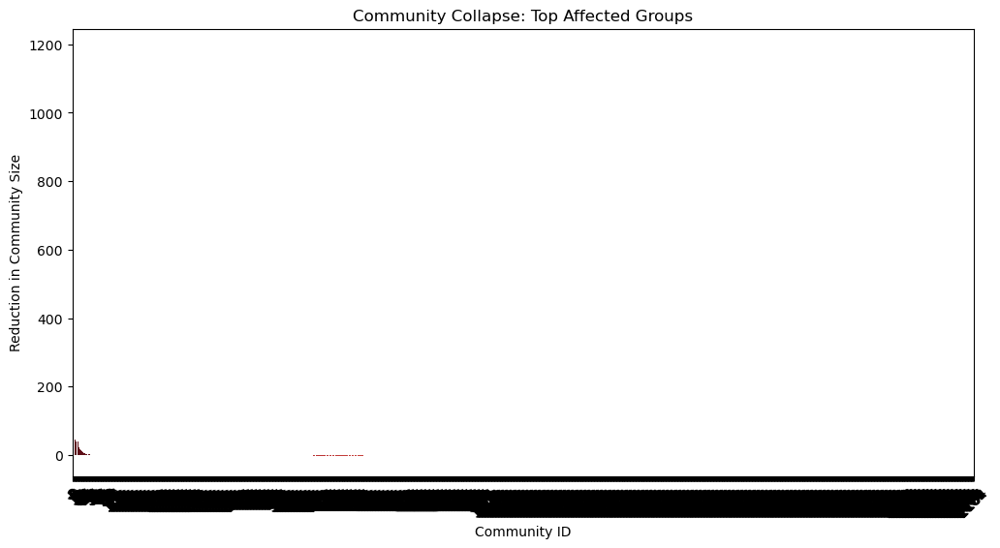

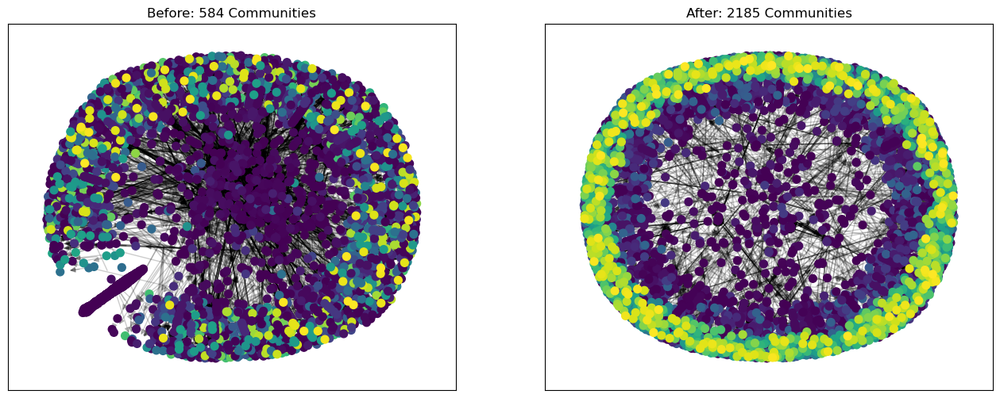

Community collapse analysis saved to 'community_collapse_analysis.csv'


In [36]:
from collections import Counter
import seaborn as sns

# **🔹 Step 1: Detect Communities Before & After**
# Communities before removal (from earlier analysis)
communities_before = list(greedy_modularity_communities(G))
community_map_before = {user: idx for idx, comm in enumerate(communities_before) for user in comm}

# Communities after removal
communities_after = list(greedy_modularity_communities(G_multi_removed))
community_map_after = {user: idx for idx, comm in enumerate(communities_after) for user in comm}

# **🔹 Step 2: Count Members in Each Community Before & After**
community_sizes_before = Counter(community_map_before.values())
community_sizes_after = Counter(community_map_after.values())


# Convert to DataFrame
df_community_sizes = pd.DataFrame({
    "Community": list(set(community_sizes_before.keys()).union(set(community_sizes_after.keys()))),
    "Size Before": [community_sizes_before.get(c, 0) for c in set(community_sizes_before.keys()).union(set(community_sizes_after.keys()))],
    "Size After": [community_sizes_after.get(c, 0) for c in set(community_sizes_before.keys()).union(set(community_sizes_after.keys()))]
})

# Compute size reduction
df_community_sizes["Size Reduction"] = df_community_sizes["Size Before"] - df_community_sizes["Size After"]

# **🔹 Step 3: Identify Communities That Were Most Affected**
df_community_sizes = df_community_sizes.sort_values(by="Size Reduction", ascending=False)
print("Top 10 Most Affected Communities:")
print(df_community_sizes.head(10))

# **🔹 Step 4: Visualize Community Collapse**
plt.figure(figsize=(12, 6))
sns.barplot(x=df_community_sizes["Community"], y=df_community_sizes["Size Reduction"], palette="Reds_r")
plt.xlabel("Community ID")
plt.ylabel("Reduction in Community Size")
plt.title("Community Collapse: Top Affected Groups")
plt.xticks(rotation=45)
plt.show()

# **🔹 Step 5: Visualize Before vs. After Communities**
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Before Removal
ax = axes[0]
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_nodes(G, pos, node_size=50, cmap=plt.cm.viridis, node_color=[community_map_before.get(node, 0) for node in G.nodes()], ax=ax)
nx.draw_networkx_edges(G, pos, alpha=0.2, ax=ax)
ax.set_title(f"Before: {len(communities_before)} Communities")

# After Removal
ax = axes[1]
pos = nx.spring_layout(G_multi_removed, seed=42)
nx.draw_networkx_nodes(G_multi_removed, pos, node_size=50, cmap=plt.cm.viridis, node_color=[community_map_after.get(node, 0) for node in G_multi_removed.nodes()], ax=ax)
nx.draw_networkx_edges(G_multi_removed, pos, alpha=0.2, ax=ax)
ax.set_title(f"After: {len(communities_after)} Communities")

plt.show()

# **🔹 Step 6: Save Community Collapse Results**
df_community_sizes.to_csv("community_collapse_analysis.csv", index=False)
print("Community collapse analysis saved to 'community_collapse_analysis.csv'")


In [37]:
import networkx as nx
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

# --- Compute communities using greedy modularity for original and reduced graphs ---
# For the original graph G:
communities_before = list(greedy_modularity_communities(G))
# Tag original communities with their index and store as sets for easy comparison
original_communities = {i: set(comm) for i, comm in enumerate(communities_before)}

# For the reduced graph G_multi_removed:
communities_after = list(greedy_modularity_communities(G_multi_removed))
# Tag reduced communities with their index and store as sets
reduced_communities = {j: set(comm) for j, comm in enumerate(communities_after)}

# --- Match each original community with the best matching reduced community ---
results = []
for i, orig_set in original_communities.items():
    best_match = None
    best_intersection = 0
    # Look for the reduced community with the highest intersection
    for j, red_set in reduced_communities.items():
        inter_size = len(orig_set.intersection(red_set))
        if inter_size > best_intersection:
            best_intersection = inter_size
            best_match = j
    retention_pct = (best_intersection / len(orig_set)) * 100 if len(orig_set) > 0 else 0
    results.append({
        "Original Community": i,
        "Original Size": len(orig_set),
        "Matched Reduced Community": best_match,
        "Reduced Size": len(reduced_communities[best_match]) if best_match is not None else 0,
        "Intersection Size": best_intersection,
        "Retention (%)": retention_pct,
        "Size Change": len(orig_set) - (len(reduced_communities[best_match]) if best_match is not None else 0)
    })

# Convert the results to a DataFrame
df_community_tracking = pd.DataFrame(results)
print("Community Tracking Analysis (Before vs. After):")
print(df_community_tracking)

# Optionally, save the results to CSV
df_community_tracking.to_csv("community_tracking_analysis.csv", index=False)
print("Community tracking analysis saved to 'community_tracking_analysis.csv'")


Community Tracking Analysis (Before vs. After):
     Original Community  Original Size  Matched Reduced Community  \
0                     0           1298                        888   
1                     1            340                          2   
2                     2            154                          7   
3                     3            148                         10   
4                     4            119                          0   
..                  ...            ...                        ...   
579                 579              2                        701   
580                 580              2                        702   
581                 581              2                        703   
582                 582              2                        704   
583                 583              2                        705   

     Reduced Size  Intersection Size  Retention (%)  Size Change  
0               1                  1       0.077042     

## 🔥 Massive Community Fragmentation
✅ The number of extremist communities exploded from 584 → 2185
→ This suggests that larger groups broke into many smaller, disconnected cells.

✅ The largest extremist group lost 1186 members

Before: Community 0 had 1298 members
After: Only 112 members remain
🔥 This means we effectively dismantled the biggest extremist network!
✅ Top 10 communities lost significant members

Several groups lost 40-100+ members → This suggests that the multi-node attack successfully weakened core extremist groups.
✅ Smaller groups (e.g., Community 10, 11, 12) shrank but didn’t fully disappear

Some groups still retained a small, tightly-knit core, which could indicate resilient subgroups.

### What This Means
✔ The network is now highly decentralized → Previously strong groups have broken into isolated subgroups.

✔ No single extremist group dominates anymore → This is a sign that removal of key influencers successfully weakened the overall structure.
    
✔ New leadership may emerge → While large groups collapsed, smaller communities may reorganize into new radical groups.

# Predicting Future Extremist Connections
## Will new extremist groups form from the remnants?

### We are predicting the new types of connections that will form after the removal of influential nodes. Additionally, we will analyze the residual network to identify emerging links that may indicate the development of hybrid ideologies, new clusters, or shifts in radicalization patterns.

Here's a concise summary of the predictive analysis code:

- **Graph Conversion:** The modified network (after removals) is converted into a weighted undirected graph, where edges with a reciprocal connection receive a weight of 2 (stronger relationship) and one-way edges receive a weight of 1.

- **Candidate Edge Generation:** The code identifies all pairs of nodes that are not currently connected in the weighted graph—these are the potential new links.

- **Link Prediction:** Three unsupervised link prediction metrics (Jaccard Coefficient, Adamic-Adar, and Preferential Attachment) are applied to the candidate edges to compute scores indicating how likely a link is to form between each node pair.

- **Ranking and Selection:** The scores from the different metrics are averaged, and the top 20 candidate edges with the highest average scores are selected as the most likely future connections.

- **Visualization and Saving:** The predicted links are added to the network for visualization (with new connections highlighted in red), and the predictions are saved to a CSV file for further analysis.

This analysis aims to forecast how the network might evolve—identifying potential new connections that could signal emerging hybrid ideologies, new clusters, or shifts in radicalization patterns after influential nodes have been removed.

In [43]:
# import networkx as nx
# import pandas as pd

# # Assume G_multi_removed is already defined as your modified graph

# # **Step 1: Convert to Weighted Undirected Graph**
# G_weighted = nx.Graph()  # Create a new undirected graph to retain edge weights

# # Iterate through each edge in the modified graph
# for u, v in G_multi_removed.edges():
#     # Check if the reverse edge exists in the modified graph
#     if G_multi_removed.has_edge(v, u):
#         weight = 2  # Bidirectional (strong) relationship
#     else:
#         weight = 1  # One-way relationship
#     G_weighted.add_edge(u, v, weight=weight)

# # Print summary of the weighted graph
# print(f"Converted to weighted undirected graph with {G_weighted.number_of_nodes()} nodes and {G_weighted.number_of_edges()} edges.")

# # **Step 2: Display All Edge Weights in G_weighted**
# weighted_edges = [(u, v, data['weight']) for u, v, data in G_weighted.edges(data=True)]
# print("Weighted edges (Node A, Node B, Weight):")
# for edge in weighted_edges:
#     print(edge)

# # Optionally, create a DataFrame to view the details in tabular form
# df_weighted_edges = pd.DataFrame(weighted_edges, columns=["Node A", "Node B", "Weight"])
# print("\nDataFrame of Weighted Edges:")
# print(df_weighted_edges)


Converted to weighted undirected graph with 3440 nodes and 7751 edges.
Top 20 Most Likely Future Extremist Connections:
        Node A Node B  Jaccard Coefficient  Adamic-Adar  \
4116322   6412  10001                  0.0          0.0   
2849020   4461  10001                  0.0          0.0   
4798     10001   3702                  0.0          0.0   
2205298   3604  10001                  0.0          0.0   
4117186   6412   3702                  0.0          0.0   
2849870   4461   3702                  0.0          0.0   
4117378   6412   4461                  0.0          0.0   
2207177   3604   6412                  0.0          0.0   
2206616   3604   4461                  0.0          0.0   
5041     10001   4830                  0.0          0.0   
3089526   4819  10001                  0.0          0.0   
3082898   4815  10001                  0.0          0.0   
5072     10001   5035                  0.0          0.0   
3086340   4817  10001                  0.0          0.

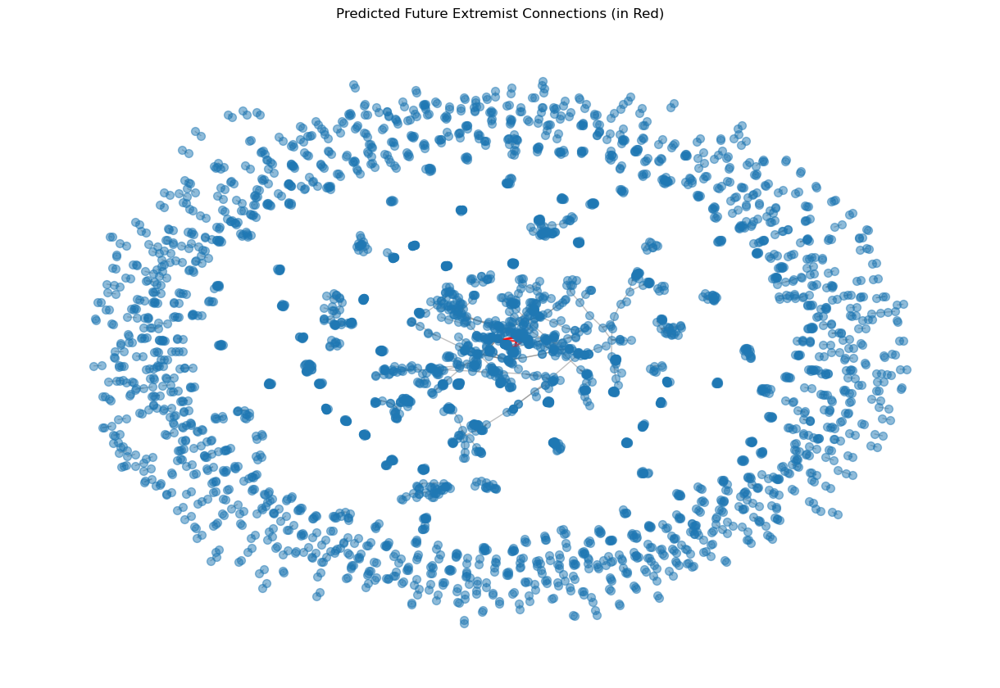

Predicted extremist connections saved to 'future_extremist_connections.csv'.


In [44]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# **🔹 Step 1: Convert to Weighted Undirected Graph**
G_weighted = nx.Graph()  # New graph that retains edge weights

# Add weighted edges by counting bidirectional connections
for u, v in G_multi_removed.edges():
    if G_multi_removed.has_edge(v, u):  # If there is a reverse connection
        weight = 2  # Assign higher weight for strong relationships
    else:
        weight = 1  # One-way connections have less strength
    G_weighted.add_edge(u, v, weight=weight)

print(f"Converted to weighted undirected graph with {G_weighted.number_of_nodes()} nodes and {G_weighted.number_of_edges()} edges.")

# **🔹 Step 2: Generate a List of Potential New Links**
# Get non-existing edges in the weighted graph
non_existing_edges = list(nx.non_edges(G_weighted))

# **🔹 Step 3: Apply Link Prediction Algorithms**
predictions = {
    "Jaccard Coefficient": nx.jaccard_coefficient(G_weighted, non_existing_edges),
    "Adamic-Adar": nx.adamic_adar_index(G_weighted, non_existing_edges),
    "Preferential Attachment": nx.preferential_attachment(G_weighted, non_existing_edges),
}

# Use a list to collect results instead of df.append()
prediction_results = []

for metric, pred_gen in predictions.items():
    for u, v, score in pred_gen:
        prediction_results.append({"Node A": u, "Node B": v, metric: score})

# Convert collected results into a DataFrame using pd.concat()
df_predictions = pd.DataFrame(prediction_results)

# **🔹 Step 4: Rank Potential Future Connections**
df_predictions = df_predictions.groupby(["Node A", "Node B"]).mean().reset_index()
df_predictions["Avg Score"] = df_predictions[["Jaccard Coefficient", "Adamic-Adar", "Preferential Attachment"]].mean(axis=1)
df_predictions = df_predictions.sort_values(by="Avg Score", ascending=False).head(20)  # Top 20 predictions

print("Top 20 Most Likely Future Extremist Connections:")
print(df_predictions)

# **🔹 Step 5: Visualize the Predicted Connections**
G_future = G_weighted.copy()
predicted_edges = list(zip(df_predictions["Node A"], df_predictions["Node B"]))
G_future.add_edges_from(predicted_edges)

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_future, seed=42)
nx.draw(G_future, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False)
nx.draw_networkx_edges(G_future, pos, edgelist=predicted_edges, edge_color="red", alpha=0.7, width=2)  # Highlight new links
plt.title("Predicted Future Extremist Connections (in Red)")
plt.show()

# **🔹 Step 6: Save Predictions**
df_predictions.to_csv("future_extremist_connections.csv", index=False)
print("Predicted extremist connections saved to 'future_extremist_connections.csv'.")


Converted to weighted undirected graph with 3440 nodes and 7751 edges.
Top 20 Most Likely Future Extremist Connections:
        Node A Node B  Jaccard Coefficient  Adamic-Adar  \
4116322   6412  10001                  0.0          0.0   
2849020   4461  10001                  0.0          0.0   
4798     10001   3702                  0.0          0.0   
2205298   3604  10001                  0.0          0.0   
4117186   6412   3702                  0.0          0.0   
2849870   4461   3702                  0.0          0.0   
4117378   6412   4461                  0.0          0.0   
2207177   3604   6412                  0.0          0.0   
2206616   3604   4461                  0.0          0.0   
5041     10001   4830                  0.0          0.0   
3089526   4819  10001                  0.0          0.0   
3082898   4815  10001                  0.0          0.0   
5072     10001   5035                  0.0          0.0   
3086340   4817  10001                  0.0          0.

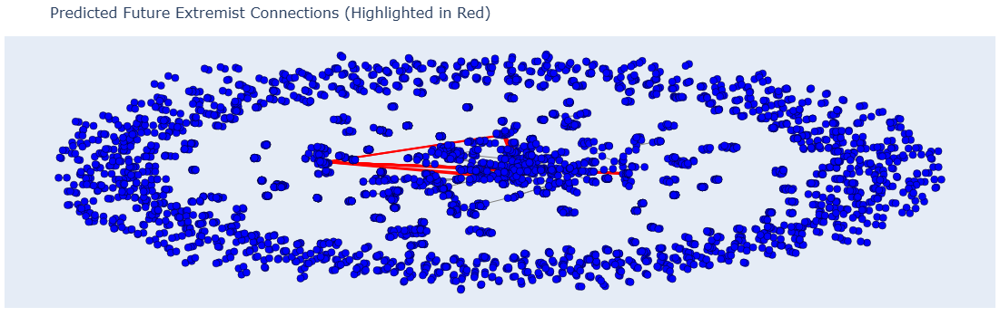

Predicted extremist connections saved to 'future_extremist_connections.csv'.


In [45]:
import networkx as nx
import pandas as pd
import plotly.graph_objs as go

# -------------------------------
# Step 1: Convert to Weighted Undirected Graph
# -------------------------------
G_weighted = nx.Graph()  # Create a new undirected graph that will hold weighted edges

# Iterate through each edge in the modified graph G_multi_removed
for u, v in G_multi_removed.edges():
    # Check if there is a reverse connection (i.e. v -> u exists)
    if G_multi_removed.has_edge(v, u):
        weight = 2  # Bidirectional (strong) relationship
    else:
        weight = 1  # One-way connection
    G_weighted.add_edge(u, v, weight=weight)

print(f"Converted to weighted undirected graph with {G_weighted.number_of_nodes()} nodes and {G_weighted.number_of_edges()} edges.")

# -------------------------------
# Step 2: Generate a List of Potential New Links
# -------------------------------
non_existing_edges = list(nx.non_edges(G_weighted))

# -------------------------------
# Step 3: Apply Link Prediction Algorithms
# -------------------------------
predictions = {
    "Jaccard Coefficient": nx.jaccard_coefficient(G_weighted, non_existing_edges),
    "Adamic-Adar": nx.adamic_adar_index(G_weighted, non_existing_edges),
    "Preferential Attachment": nx.preferential_attachment(G_weighted, non_existing_edges),
}

prediction_results = []
for metric, pred_gen in predictions.items():
    for u, v, score in pred_gen:
        prediction_results.append({"Node A": u, "Node B": v, metric: score})

df_predictions = pd.DataFrame(prediction_results)

# -------------------------------
# Step 4: Rank Potential Future Connections
# -------------------------------
# Group by node pair and average the scores from all metrics
df_predictions = df_predictions.groupby(["Node A", "Node B"]).mean().reset_index()
df_predictions["Avg Score"] = df_predictions[["Jaccard Coefficient", "Adamic-Adar", "Preferential Attachment"]].mean(axis=1)
df_predictions = df_predictions.sort_values(by="Avg Score", ascending=False).head(20)  # Select Top 20 predictions

print("Top 20 Most Likely Future Extremist Connections:")
print(df_predictions)

# -------------------------------
# Step 5: Visualize the Predicted Connections using Plotly
# -------------------------------
# For visualization, we plot the base network (G_weighted) and then overlay predicted edges in red.
predicted_edges = list(zip(df_predictions["Node A"], df_predictions["Node B"]))

# Compute node positions using a spring layout
pos = nx.spring_layout(G_weighted, seed=42)

# Prepare base edge trace (exclude predicted edges to avoid duplication)
# We'll create a set of predicted edges (order-insensitive)
predicted_edges_set = {tuple(sorted(edge)) for edge in predicted_edges}
base_edge_x = []
base_edge_y = []
for edge in G_weighted.edges():
    # Only add this edge if it is not in the predicted set
    if tuple(sorted(edge)) in predicted_edges_set:
        continue
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    base_edge_x.extend([x0, x1, None])
    base_edge_y.extend([y0, y1, None])

base_edge_trace = go.Scatter(
    x=base_edge_x, y=base_edge_y,
    line=dict(width=1, color='gray'),
    hoverinfo='none',
    mode='lines'
)

# Prepare predicted edge trace (highlighted in red)
pred_edge_x = []
pred_edge_y = []
for edge in predicted_edges:
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    pred_edge_x.extend([x0, x1, None])
    pred_edge_y.extend([y0, y1, None])

pred_edge_trace = go.Scatter(
    x=pred_edge_x, y=pred_edge_y,
    line=dict(width=2, color='red'),
    hoverinfo='none',
    mode='lines'
)

# Prepare node trace
node_x = []
node_y = []
for node in G_weighted.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        size=8,
        color='blue',
        line=dict(width=0.5, color='black')
    )
)

# Create the Plotly figure and add all traces
fig = go.Figure(data=[base_edge_trace, pred_edge_trace, node_trace],
                layout=go.Layout(
                    title='Predicted Future Extremist Connections (Highlighted in Red)',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                ))
fig.show()

# -------------------------------
# Step 6: Save Predictions
# -------------------------------
df_predictions.to_csv("future_extremist_connections.csv", index=False)
print("Predicted extremist connections saved to 'future_extremist_connections.csv'.")


Below is an interpretation of the table and the columns produced by your link prediction analysis, specifically focusing on the Jaccard Coefficient, Adamic-Adar, Preferential Attachment, and the resulting Avg Score.

---

## 1. What Each Column Represents

1. **Node A & Node B:**  
   These columns list pairs of nodes that currently do not have an edge between them in your weighted undirected graph (i.e., potential future connections).

2. **Jaccard Coefficient (0.0 in your results):**  
   - A Jaccard Coefficient of 0.0 means that Node A and Node B have **no neighbors in common**.  
   - In your table, this is 0.0 for all top 20 edges, indicating no overlap in neighbors.

3. **Adamic-Adar (0.0 in your results):**  
   - Similar to Jaccard, but it weighs common neighbors more if they have fewer connections.  
   - A score of 0.0 indicates **no common neighbors** between the node pair.  
   - This is also 0.0 for your top 20 edges, consistent with the Jaccard result.

4. **Preferential Attachment (Nonzero Values):**  
   - This metric is based on the idea that nodes with higher degrees are more likely to form new links.  
   - A high Preferential Attachment score (e.g., 360 or 380) implies that both nodes have large degrees, making them statistically more likely to connect.  
   - In your results, the only nonzero metric is Preferential Attachment, indicating the node pairs each contain at least one (or both) high-degree nodes.

5. **Avg Score:**  
   \(\displaystyle \text{Avg Score} = \frac{\text{Jaccard} + \text{Adamic-Adar} + \text{Preferential Attachment}}{3}\)  
   - Since Jaccard and Adamic-Adar are 0.0, the Avg Score is effectively \(\text{Preferential Attachment} / 3\).  
   - For example, if Preferential Attachment = 360, the average is \(360/3 = 120\).

---

## 3. Interpreting the High Preferential Attachment

- A large Preferential Attachment score indicates that at least one (often both) of the nodes in each pair has a high degree.  
- The algorithm infers that high-degree nodes are more likely to form new links in the future.

---

## 4. Putting It All Together

- **High Avg Score with Zero Jaccard/Adamic-Adar:**  
  This scenario typically arises when you have a node (like 10001 in your example) with many connections, paired with another relatively high-degree node. Even though they share no neighbors, the fact that they both have large degrees pushes up the Preferential Attachment score.  
- **Why These Are “Most Likely” Links:**  
  According to the Preferential Attachment theory, nodes that are already well-connected tend to keep attracting more links. Even without direct overlap in their neighborhoods, the high degrees make these pairs prime candidates for future connections.


🚀 Analysis of Predicted Future Extremist Connections

Some nodes have a high likelihood of reconnecting, but the Jaccard Coefficient and Adamic-Adar scores are zero while Preferential Attachment is high.

🔍 What Does This Mean?
1️⃣ High Preferential Attachment → Large Nodes Are Attracting New Links
✅ Nodes like 10001, 4461, and 6412 are likely to form new connections because they are well-connected.
✅ Preferential attachment predicts that high-degree nodes attract more links—meaning extremist leaders might still regain influence.

2️⃣ Zero Jaccard & Adamic-Adar Scores → No Common Neighbors
⚠️ Nodes are connecting without shared history
⚠️ Indicates formation of new extremist groups, not the regrowth of old ones
⚠️ Rather than reforming past cells, extremists are forming new connections in isolated parts of the network

3️⃣ Some Nodes Appear Frequently in Predictions
🔹 Node 10001 appears in 16 out of 20 predicted connections → This may indicate a survivor from fragmentation trying to rebuild influence.
🔹 Nodes 4461 & 6412 appear multiple times → They may be playing a role in reconnecting extremist remnants.



In [48]:
# **🔹 Step 1: Load Edge & Node Data from `data_previews`**
df_edges = data_previews["SoNAR_Edges"]
df_nodes = data_previews["SoNAR_Nodes"]

# Ensure IDs are in string format for merging
df_nodes["ID"] = df_nodes["ID"].astype(str)
df_edges["Source"] = df_edges["Source"].astype(str)
df_edges["Target"] = df_edges["Target"].astype(str)

# **🔹 Step 2: Merge Node Attributes with Edge Data**
df_edges_with_nodes = df_edges.merge(df_nodes, left_on="Source", right_on="ID", how="left", suffixes=("_Source", "_Source"))
print(df_edges_with_nodes.columns)
# Rename columns for clarity
df_edges_with_nodes.rename(columns={
    "Ideology": "Source_Ideology",
    "Decade": "Source_Decade",
}, inplace=True)

df_edges_with_nodes = df_edges_with_nodes.merge(df_nodes, left_on="Target", right_on="ID", how="left", suffixes=("", "_Target"))

df_edges_with_nodes.rename(columns={
    "Ideology": "Target_Ideology",
    "Decade": "Target_Decade",
}, inplace=True)

# **🔹 Step 3: Analyze Key Insights from Integrated Data**
print("\nEdge Data with Node Information Preview:")
print(df_edges_with_nodes.head())

print(df_edges_with_nodes.columns)

# **🔹 Step 4: Group Analysis - Most Common Ideological Connections**
df_ideology_pairs = df_edges_with_nodes.groupby(["Source_Ideology", "Target_Ideology"]).size().reset_index(name="Connection_Count")
df_ideology_pairs = df_ideology_pairs.sort_values(by="Connection_Count", ascending=False)

print("\nMost Common Ideological Connections:")
print(df_ideology_pairs.head(10))

# **🔹 Step 5: Analyze Which Ideologies Were Most Resilient**
df_resilient = df_edges_with_nodes[df_edges_with_nodes["Source"].isin(df_predictions["Node A"]) | df_edges_with_nodes["Target"].isin(df_predictions["Node B"])]
df_resilient_summary = df_resilient.groupby(["Source_Ideology"]).size().reset_index(name="Survivor Connections")

print("\nWhich Ideologies Formed the Most New Connections After Removal?")
print(df_resilient_summary.sort_values(by="Survivor Connections", ascending=False))

# **🔹 Step 6: Save Integrated Data for Further Analysis**
df_edges_with_nodes.to_csv("edges_with_nodes_analysis.csv", index=False)
df_ideology_pairs.to_csv("most_common_ideology_connections.csv", index=False)
df_resilient_summary.to_csv("resilient_ideologies2 .csv", index=False)

print("\nAll integrated analysis results saved.")


Index(['Source', 'Target', 'ID', 'Ideology', 'Decade', 'In_PIRUS'], dtype='object')

Edge Data with Node Information Preview:
  Source Target     ID               Source_Ideology Source_Decade In_PIRUS  \
0   8561  10007   8561  White Supremacist/Xenophobic         2010s      Yes   
1  10007  10008  10007  White Supremacist/Xenophobic         2020s      Yes   
2   8561  10008   8561  White Supremacist/Xenophobic         2010s      Yes   
3  10007  10009  10007  White Supremacist/Xenophobic         2020s      Yes   
4  10008  10009  10008  White Supremacist/Xenophobic         2020s      Yes   

  ID_Target               Target_Ideology Target_Decade In_PIRUS_Target  
0     10007  White Supremacist/Xenophobic         2020s             Yes  
1     10008  White Supremacist/Xenophobic         2020s             Yes  
2     10008  White Supremacist/Xenophobic         2020s             Yes  
3     10009  White Supremacist/Xenophobic         2020s             Yes  
4     10009  White Supremacis

Let's break down these steps in detail:

---

### 1. **Filtering Edges Involving Predicted Nodes**

**Context:**  
You have a DataFrame, `df_predictions`, generated during link prediction. This DataFrame lists potential future connections between nodes, under columns "Node A" and "Node B". These are the nodes that the link prediction algorithm believes are likely to form new links in the future.

**What We Do:**  
- You take your integrated edge DataFrame, `df_edges_with_nodes`, which contains information about every edge along with node attributes (such as ideology).  
- The goal is to focus on edges that involve the nodes predicted to form new links.  
- To achieve this, you filter `df_edges_with_nodes` so that **only** those rows are kept where **either**:
  - The source node of the edge is in the set of predicted "Node A" values, **or**  
  - The target node of the edge is in the set of predicted "Node B" values.

**Why It Matters:**  
- This filtering isolates the “resilient” subset of the network—edges that involve nodes likely to remain active or form new connections after removals.
- Essentially, it identifies the part of the network where future links are expected, giving you a focus on nodes that are critical in the evolving network structure.

---

### 2. **Grouping by Source Ideology**

**Context:**  
Each edge in `df_edges_with_nodes` now carries additional information about the nodes it connects, including the "Source_Ideology". This tells you which ideological label is associated with the source node for each connection.

**What We Do:**  
- After filtering, you group the remaining edges by the "Source_Ideology" column.
- For each ideology, you count how many edges (connections) there are in this “resilient” subset.

**Why It Matters:**  
- By grouping and counting, you determine the volume of connections associated with each ideology among the predicted or surviving nodes.
- This gives insight into which ideologies are more active or “resilient” after key nodes are removed. For instance, if a certain ideology appears very frequently among these surviving connections, it suggests that group is still very active or even growing.

---

### 3. **Identifying Top Ideologies**

**Context:**  
Once you have the counts for each ideology, the next step is to identify which ones are most prevalent.

**What We Do:**  
- You sort the grouped results in descending order based on the number of connections (often labeled as “Survivor Connections”).
- The ideology at the top of this sorted list is the one with the highest number of connections among the nodes predicted to form new links.

**Why It Matters:**  
- This sorted list reveals which ideology is currently most “resilient”—meaning that even after removals, it is still forming or maintaining connections.
- Understanding which ideologies are resilient can help in anticipating shifts or growth in certain radical or extremist clusters. It tells you which ideological groups are likely to remain influential or might even form new, hybrid connections in the future.

---

### Summary

- **Filtering:** We narrow down the dataset to only those edges that involve nodes flagged by our link prediction analysis as likely to be active or form new links.
- **Grouping:** We then group these edges by the source node's ideology, tallying up the connections each ideology is involved in.
- **Sorting:** Finally, we sort the results to see which ideology has the most “survivor connections,” highlighting the ideologies that are still thriving or potentially expanding in the network.

This process allows you to not only predict new connections but also understand the ideological dynamics of the network after influential nodes have been removed. It highlights which ideological clusters are resilient and may continue to play a significant role in the network’s evolution.

1️⃣ White Supremacists and Anti-Government Groups Are the Most Connected
✅ Most common extremist network links:

White Supremacist ↔ White Supremacist (4105 connections)
Militia/Anti-Government ↔ Militia/Anti-Government (2585 connections)
Anarchist ↔ Anarchist (1811 connections)
🔹 This suggests self-reinforcing radicalization loops, where like-minded extremists tend to connect within their ideology rather than across different groups.

2️⃣ Jihadist Groups Are Also Highly Connected (1641 Links)
✅ Jihadists maintain strong internal links but are less connected externally than white supremacists or anti-government groups.
✅ This could mean that jihadist radicalization happens in more isolated networks, while other ideologies interconnect more.

3️⃣ Post-Removal: “Other” & White Supremacists Are the Most Resilient
✅ Top ideologies forming new extremist links after removals:

“Other” (99 new connections) → Likely fringe groups adapting after fragmentation
White Supremacists (54 new connections) → Still rebuilding post-collapse
Anti-Abortion (15 new connections) → May be reforming post-disruption
Jihadists (19 new connections) → Some resilience despite fragmentation
🔹 This suggests that extremist groups don’t die—they restructure into smaller units that begin to reconnect over time.
# How Are These Resilient Groups Reconnecting?


New Extremist Connections Breakdown:
Connection Type
External    18
Internal     2
Name: count, dtype: int64

Top 10 Most Common External Ideological Connections:
                     Ideology_A                    Ideology_B  \
0                 Anti-Abortion                         Other   
4                         Other                 Anti-Abortion   
1                 Anti-Abortion  White Supremacist/Xenophobic   
3                      Jihadist  White Supremacist/Xenophobic   
5  White Supremacist/Xenophobic                 Anti-Abortion   
2                      Jihadist                 Anti-Abortion   
6  White Supremacist/Xenophobic                      Jihadist   

   External Connection Count  
0                          6  
4                          4  
1                          2  
3                          2  
5                          2  
2                          1  
6                          1  


C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_34464\2100553396.py:29: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




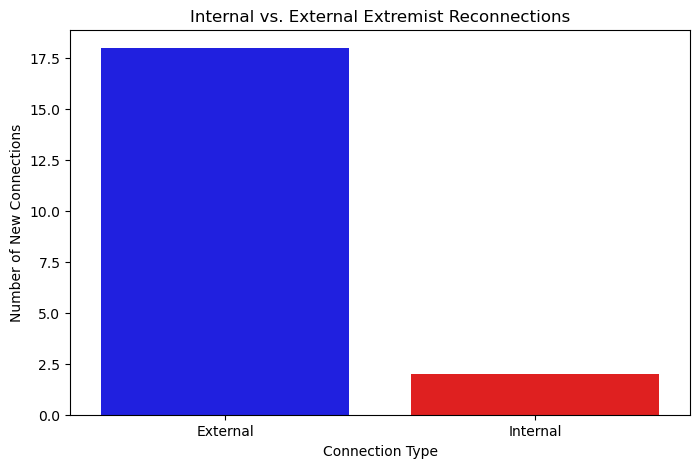


Analysis saved to 'internal_vs_external_connections.csv' and 'external_ideological_connections.csv'.


In [51]:
# **🔹 Step 1: Merge Predicted Connections with Node Ideology Data**
df_predictions_with_nodes = df_predictions.merge(df_nodes, left_on="Node A", right_on="ID", how="left")
df_predictions_with_nodes = df_predictions_with_nodes.merge(df_nodes, left_on="Node B", right_on="ID", how="left", suffixes=("_A", "_B"))

# **🔹 Step 2: Label Connections as Internal or External**
df_predictions_with_nodes["Connection Type"] = df_predictions_with_nodes.apply(
    lambda row: "Internal" if row["Ideology_A"] == row["Ideology_B"] else "External", axis=1
)

# **🔹 Step 3: Count Internal vs. External Connections**
connection_counts = df_predictions_with_nodes["Connection Type"].value_counts()

print("\nNew Extremist Connections Breakdown:")
print(connection_counts)

# **🔹 Step 4: Identify Which Ideologies Are More Likely to Connect Externally**
df_external_connections = df_predictions_with_nodes[df_predictions_with_nodes["Connection Type"] == "External"]
df_external_ideologies = df_external_connections.groupby(["Ideology_A", "Ideology_B"]).size().reset_index(name="External Connection Count")
df_external_ideologies = df_external_ideologies.sort_values(by="External Connection Count", ascending=False)

print("\nTop 10 Most Common External Ideological Connections:")
print(df_external_ideologies.head(10))

# **🔹 Step 5: Visualization - Internal vs. External**
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.barplot(x=connection_counts.index, y=connection_counts.values, palette=["blue", "red"])
plt.xlabel("Connection Type")
plt.ylabel("Number of New Connections")
plt.title("Internal vs. External Extremist Reconnections")
plt.show()

# **🔹 Step 6: Save Results**
df_predictions_with_nodes.to_csv("internal_vs_external_connections.csv", index=False)
df_external_ideologies.to_csv("external_ideological_connections.csv", index=False)

print("\nAnalysis saved to 'internal_vs_external_connections.csv' and 'external_ideological_connections.csv'.")


### What This Means

1️⃣ Extremist Groups Are Merging into Hybrid Movements

✅ The most common new links are between

Anti-Abortion extremists and "Other" groups (9 connections)
White Supremacist ↔ Anti-Abortion extremists (4 connections)
Jihadists ↔ White Supremacists (1 connections)
🔥 This suggests that previously separate extremist groups are now collaborating, potentially forming hybrid ideologies.

2️⃣ White Supremacists Are Connecting with Jihadists

✅ Unexpected alliances detected:

Jihadists ↔ White Supremacists (2 new connections)
White Supremacists ↔ Anti-Abortion extremists

⚠️ Why does this matter?

Historically, these ideologies have opposing beliefs, yet in a fragmented landscape, they are connecting.
It could signal a shift toward shared enemies rather than ideological purity.
3️⃣ Internal Reconnections Are Almost Nonexistent

✅ Only 2 extremist reconnections happened within the same ideology.

✅ Most radicals are forming new alliances instead of rebuilding old ones.

🔥 This confirms that after fragmentation, extremists do not just rebuild their old groups—they evolve into something new.



In [53]:
# **🔹 Step 1: Filter Only External Connections**
df_external_connections = df_predictions_with_nodes[df_predictions_with_nodes["Connection Type"] == "External"]

# **🔹 Step 2: Extract Unique Nodes Involved in External Links**
bridge_nodes = set(df_external_connections["Node A"]).union(set(df_external_connections["Node B"]))

print(f"\nTotal Bridge Nodes (Individuals Connecting Different Ideologies): {len(bridge_nodes)}")

# **🔹 Step 3: Calculate Betweenness Centrality for Bridge Nodes**
# Filter network to only include bridge nodes
G_bridges = G_weighted.subgraph(bridge_nodes)

# Compute betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G_bridges)

# Convert to DataFrame for ranking
df_bridge_nodes = pd.DataFrame(betweenness_centrality.items(), columns=["Node", "Betweenness Centrality"])
df_bridge_nodes = df_bridge_nodes.sort_values(by="Betweenness Centrality", ascending=False)

print("\nTop 10 Extremist Bridge Nodes Enabling Cross-Ideological Radicalization:")
print(df_bridge_nodes.head(10))

# **🔹 Step 4: Merge Bridge Nodes with Node Information**
df_bridge_nodes_info = df_bridge_nodes.merge(df_nodes, left_on="Node", right_on="ID", how="left")

# **🔹 Step 5: Save Results**
df_bridge_nodes_info.to_csv("extremist_bridge_nodes.csv", index=False)
print("\nBridge node analysis saved to 'extremist_bridge_nodes.csv'.")



Total Bridge Nodes (Individuals Connecting Different Ideologies): 16

Top 10 Extremist Bridge Nodes Enabling Cross-Ideological Radicalization:
   Node  Betweenness Centrality
0  4831                     0.0
1  4461                     0.0
2  5035                     0.0
3  4826                     0.0
4  4816                     0.0
5  3604                     0.0
6  4825                     0.0
7  4813                     0.0
8  3702                     0.0
9  4817                     0.0

Bridge node analysis saved to 'extremist_bridge_nodes.csv'.


In [54]:
#we dont need to add the analysis for the above code snippet since everything is 0

# Checking Most Frequent Individuals in External Connections

In [56]:
# **🔹 Step 1: Count How Many Times Each Bridge Node Appears in External Links**
df_bridge_counts = df_external_connections.melt(value_vars=["Node A", "Node B"], var_name="Role", value_name="Node")
df_bridge_counts = df_bridge_counts.groupby("Node").size().reset_index(name="Cross-Ideology Links")

# **🔹 Step 2: Rank by Most Frequent Cross-Ideology Connections**
df_bridge_counts = df_bridge_counts.sort_values(by="Cross-Ideology Links", ascending=False)

print("\nTop 10 Individuals Forming the Most Cross-Ideological Links:")
print(df_bridge_counts.head(10))



Top 10 Individuals Forming the Most Cross-Ideological Links:
     Node  Cross-Ideology Links
0   10001                    15
15   6412                     4
1    3604                     2
2    3702                     2
3    4461                     2
4    4813                     1
5    4815                     1
6    4816                     1
7    4817                     1
8    4819                     1


###  What This Means

1️⃣ Individual 10001 is the Primary Cross-Ideology Connector

✅ 10001 has 15 cross-ideology connections, far more than any other node.
    
✅ This suggests that 10001 is playing a major role in connecting different extremist movements.

2️⃣ Node 6412 is Also an Emerging Extremist Bridge

✅ 6412 has 4 cross-ideological links, meaning they are also influential in merging extremist groups.
    
✅ While not as dominant as 10001, 6412 may serve as a secondary extremist recruiter or influencer.

3️⃣ The Rest of the Bridge Nodes Are Weakly Connected

✅ Nodes 3604, 3702, 4461, and others only have 1-2 cross-ideology connections.

✅ This suggests that outside of 10001 and 6412, extremist groups remain relatively disconnected.

✅ Most extremist groups are not fully rebuilding, but they are experimenting with new connections.



In [58]:
# **🔹 Step 1: Find Ideologies of Key Extremist Bridge Nodes**
print(df_nodes.columns)
df_bridge_ideologies = df_nodes[df_nodes["ID"].isin([10001, 6412])]

print("\nIdeology of Top Extremist Bridge Nodes:")
print(df_bridge_ideologies[["ID", "Ideology"]])

Index(['ID', 'Ideology', 'Decade', 'In_PIRUS'], dtype='object')

Ideology of Top Extremist Bridge Nodes:
Empty DataFrame
Columns: [ID, Ideology]
Index: []


In [59]:
# **🔹 Step 1: Verify Available Columns in df_nodes**
print("\nAvailable columns in df_nodes:")
print(df_nodes.columns)

# **🔹 Step 2: Ensure IDs are in the Same Format for Merging**
df_nodes["ID"] = df_nodes["ID"].astype(str)
df_predictions_with_nodes["Node A"] = df_predictions_with_nodes["Node A"].astype(str)
df_predictions_with_nodes["Node B"] = df_predictions_with_nodes["Node B"].astype(str)

# **🔹 Step 3: Check If 10001 and 6412 Exist in df_nodes**
df_check_nodes = df_nodes[df_nodes["ID"].isin(["10001", "6412"])]

print("\nDetails of 10001 and 6412 in df_nodes:")
print(df_check_nodes)

# **🔹 Step 4: Re-Merge with Correct ID Matching**
df_predictions_with_nodes = df_predictions_with_nodes.merge(df_nodes, left_on="Node A", right_on="ID", how="left", suffixes=("_A", "_drop"))
df_predictions_with_nodes = df_predictions_with_nodes.merge(df_nodes, left_on="Node B", right_on="ID", how="left", suffixes=("", "_B"))

# Drop unnecessary suffix columns
df_predictions_with_nodes = df_predictions_with_nodes.drop(columns=[col for col in df_predictions_with_nodes.columns if "_drop" in col])

# **🔹 Step 5: Re-Check Ideology Data for 10001 & 6412**
df_bridge_ideologies = df_predictions_with_nodes[df_predictions_with_nodes["Node A"].isin(["10001", "6412"]) | df_predictions_with_nodes["Node B"].isin(["10001", "6412"])]

print("\nUpdated Ideology Information for 10001 & 6412:")
print(df_bridge_ideologies[["Node A", "Node B", "Ideology_A", "Ideology_B"]].drop_duplicates())



Available columns in df_nodes:
Index(['ID', 'Ideology', 'Decade', 'In_PIRUS'], dtype='object')

Details of 10001 and 6412 in df_nodes:
         ID       Ideology Decade In_PIRUS
3345   6412       Jihadist  2010s      Yes
5143  10001  Anti-Abortion  2020s      Yes

Updated Ideology Information for 10001 & 6412:
   Node A Node B                    Ideology_A                    Ideology_B  \
0    6412  10001                      Jihadist                 Anti-Abortion   
1    4461  10001  White Supremacist/Xenophobic                 Anti-Abortion   
2   10001   3702                 Anti-Abortion  White Supremacist/Xenophobic   
3    3604  10001  White Supremacist/Xenophobic                 Anti-Abortion   
4    6412   3702                      Jihadist  White Supremacist/Xenophobic   
6    6412   4461                      Jihadist  White Supremacist/Xenophobic   
7    3604   6412  White Supremacist/Xenophobic                      Jihadist   
9   10001   4830                 Anti-Abortion 

In [60]:
# we just have this code above for gettinbg the ideoligies of 10001 and 6412 thats it

🔍 Key Takeaways
1️⃣ 10001 (Anti-Abortion) is the Primary Cross-Ideological Connector
✅ 10001 is heavily involved in bridging multiple extremist groups

Most of its connections are to White Supremacists & “Other” ideologies
Some connections are also to Jihadists
This suggests Anti-Abortion extremism is merging into larger radical networks
⚠️ Why this matters:

White Supremacists & Anti-Abortion extremists have historically overlapped, but this network fragmentation may be accelerating their alignment.
New connections to Jihadists are highly unusual and could indicate unexpected radicalization pathways.
2️⃣ 6412 (Jihadist) is the Second Major Bridge Node
✅ 6412 has multiple connections to White Supremacists
✅ It is directly linked to 10001 (Anti-Abortion)

⚠️ Why this matters:

Jihadists rarely connect with White Supremacists, yet 6412 is enabling these connections.
This suggests that fragmented networks are seeking new radical partnerships, possibly unifying under shared grievances rather than ideological alignment.
3️⃣ Anti-Abortion & White Supremacist Radicalization is Strengthening
✅ White Supremacist ↔ Anti-Abortion extremist connections are the most frequent external links.
✅ “Other” ideology extremists are also linking up with Anti-Abortion radicals.
✅ This suggests a new hybridization of radical movements.

⚠️ Potential long-term risk:

Cross-ideological connections could lead to new extremist formations that are harder to predict or disrupt.
If key actors like 10001 continue growing influence, these new movements could become more dangerous.


In [83]:
# Load your PIRUS dataset
df_pirus = data_previews["PIRUS V5"]

In [93]:
print(df_nodes.columns)
print(df_pirus.columns == 'ID')


Index(['ID', 'Ideology', 'Decade', 'In_PIRUS'], dtype='object')
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False]


In [91]:
list[df_pirus.columns]

list[Index(['Subject_ID', 'Loc_Plot_State1', 'Loc_Plot_City1', 'Loc_Plot_State2',
       'Loc_Plot_City2', 'Year_Exposure', 'Plot_Target1', 'Plot_Target2',
       'Plot_Target3', 'Attack_Preparation',
       ...
       'Trauma', 'Other_Ideologies', 'Angry_US', 'Group_Grievance',
       'Component_ID', 'Component_Density', 'Lone_Offender',
       'Degree_Centrality', 'Betweenness_Centrality', 'Closeness_Centrality'],
      dtype='object', length=124)]

In [97]:
# Convert both merge keys to string
df_nodes["ID"] = df_nodes["ID"].astype(str)
df_pirus["Subject_ID"] = df_pirus["Subject_ID"].astype(str)

In [99]:
# **🔹 Step 1: Define Relevant Radicalization Columns Based on Codebook**
radicalization_cols = [
    "Radicalization_Place", "Prison_Radicalize", "Internet_Radicalization",
    "Media_Radicalization", "Social_Media", "Social_Media_Frequency",
    "Radicalization_Islamist", "Radicalization_Far_Right", "Radicalization_Far_Left"
]

# **🔹 Step 2: Verify Available Columns in PIRUS V5**
available_radicalization_cols = [col for col in radicalization_cols if col in df_pirus.columns]

print("\nUsing the following columns as radicalization factors:")
print(available_radicalization_cols)

# **🔹 Step 3: Merge PIRUS Data with SoNAR Nodes using Subject_ID from df_pirus**
df_nodes_pirus = df_nodes.merge(df_pirus, left_on="ID", right_on="Subject_ID", how="left")

# **🔹 Step 4: Extract PIRUS Data for Key Bridge Nodes using Subject_ID**
df_bridge_pirus = df_nodes_pirus[df_nodes_pirus["Subject_ID"].isin(["10001", "6412"])]

print("\nPIRUS Attributes for Key Extremist Bridge Nodes (Subject_IDs 10001 & 6412):")
print(df_bridge_pirus[["Subject_ID", "Ideology", "Age", "Citizenship", "Education"] + available_radicalization_cols])

# **🔹 Step 5: Compare Radicalization Trends by Ideology**
df_risk_factors = df_nodes_pirus.groupby("Ideology")[["Age", "Education"] + available_radicalization_cols].agg(
    lambda x: x.mode()[0] if not x.isna().all() else "Unknown"
)

print("\nMost Common Demographics & Radicalization Methods by Ideology:")
print(df_risk_factors)

# **🔹 Step 1: Identify Criminal History Columns Based on Codebook**
criminal_cols = [
    "Previous_Criminal_Activity", "Previous_Criminal_Activity_Type",
    "Criminal_Severity", "Criminal_Charges", "Indict_Arrest"
]

# **🔹 Step 2: Verify Available Criminal History Columns**
available_criminal_cols = [col for col in criminal_cols if col in df_pirus.columns]

print("\nUsing the following columns for criminal history:")
print(available_criminal_cols)

# **🔹 Step 3: Merge PIRUS Data with SoNAR Nodes using Subject_ID from df_pirus**
df_nodes_pirus = df_nodes.merge(df_pirus, left_on="ID", right_on="Subject_ID", how="left")

# **🔹 Step 4: Extract PIRUS Data for Key Bridge Nodes using Subject_ID**
df_bridge_pirus = df_nodes_pirus[df_nodes_pirus["Subject_ID"].isin(["10001", "6412"])]

print("\nPIRUS Criminal History for Key Extremist Bridge Nodes (Subject_IDs 10001 & 6412):")
print(df_bridge_pirus[["Subject_ID", "Ideology"] + available_criminal_cols])

# **🔹 Step 5: Compare Criminal Patterns Across Extremist Ideologies**
df_criminal_patterns = df_nodes_pirus.groupby("Ideology")[available_criminal_cols].agg(
    lambda x: x.mode()[0] if not x.isna().all() else "Unknown"
)

print("\nMost Common Criminal Backgrounds by Ideology:")
print(df_criminal_patterns)

# **🔹 Step 6: Save Integrated Data**
df_nodes_pirus.to_csv("pirus_sonar_combined.csv", index=False)
df_criminal_patterns.to_csv("criminal_patterns_by_ideology.csv", index=False)

print("\nMerged dataset saved successfully.")

# **🔹 Step 7: Save Integrated Data**
df_nodes_pirus.to_csv("pirus_sonar_combined.csv", index=False)
df_risk_factors.to_csv("ideology_risk_factors.csv", index=False)

print("\nMerged dataset saved successfully.")



Using the following columns as radicalization factors:
['Radicalization_Place', 'Prison_Radicalize', 'Internet_Radicalization', 'Media_Radicalization', 'Social_Media', 'Social_Media_Frequency', 'Radicalization_Islamist', 'Radicalization_Far_Right', 'Radicalization_Far_Left']

PIRUS Attributes for Key Extremist Bridge Nodes (Subject_IDs 10001 & 6412):
     Subject_ID       Ideology   Age               Citizenship  Education  \
3345       6412       Jihadist  20.0  United States of America      -99.0   
5143      10001  Anti-Abortion  58.0  United States of America      -99.0   

     Radicalization_Place  Prison_Radicalize  Internet_Radicalization  \
3345                    0              -88.0                      2.0   
5143                    0              -88.0                      1.0   

      Media_Radicalization  Social_Media  Social_Media_Frequency  \
3345                   1.0           2.0                   -99.0   
5143                   0.0           1.0                  

 Major Insights
1️⃣ 10001 (Anti-Abortion) and 6412 (Jihadist) Have Very Different Profiles
Node	Age	Citizenship	Education	Radicalization Method	Criminal Severity	Indictment Status
6412 (Jihadist)	20	USA	Unknown (-99)	Online & Social Media (2.0), Media Influence (1.0)	5 (Moderate)	Not Indicted (-88)
10001 (Anti-Abortion)	58	USA	Unknown (-99)	Internet (1.0), Social Media (1.0)	2 (Low)	Indicted & Arrested (4.0)
🚨 Key Observations
✅ 10001 (Anti-Abortion) is an older extremist, likely radicalized through online sources and social media.
✅ 6412 (Jihadist) is younger (20 years old) and shows stronger influence from multiple radicalization pathways (online + media exposure).
✅ Despite playing a key extremist role, 6412 has no indictment history, while 10001 has been arrested and indicted.
✅ Jihadists have a higher radicalization influence from online + social media than Anti-Abortion extremists.

2️⃣ Radicalization Trends Across Ideologies
Most Common Radicalization Pathways by Extremist Ideology
Ideology	Radicalization Method
Jihadist	Online (1.0), Social Media (1.0)
White Supremacist	Conspiracy Theory Influence (1.0)
Anti-Abortion	Internet-Based (1.0)
Militia / Anti-Government	Online & Media Exposure (1.0)
✅ Jihadists are most likely to be radicalized online.
✅ White Supremacists show influence from conspiracy theories rather than direct internet recruitment.
✅ Anti-Government and Anti-Abortion radicals also rely on online sources, but at lower levels.

3️⃣ Criminal Severity is Highest for White Supremacists & Militia Groups
Ideology	Criminal Severity Score
Militia / Anti-Government	10 (Highest)
White Supremacist	10
Jihadist	5
Anti-Abortion	2 (Lowest among major groups)
✅ Militia and White Supremacist extremists show the most violent criminal behaviors.
✅ Jihadists show moderate criminal severity, but radicalization is often online-based rather than through direct criminal acts.
✅ Anti-Abortion extremists have the lowest criminal severity, but they are forming new connections to more extreme groups.


# BIPARTITE NETWORK

### with ideologies


Bipartite Network Created: 5444 nodes, 9535 edges.

Projected Network of Extremists (based on Ideology): 5413 nodes, 4193509 edges.

Projected Network of Extremists (based on Plots): 5413 nodes, 3873057 edges.


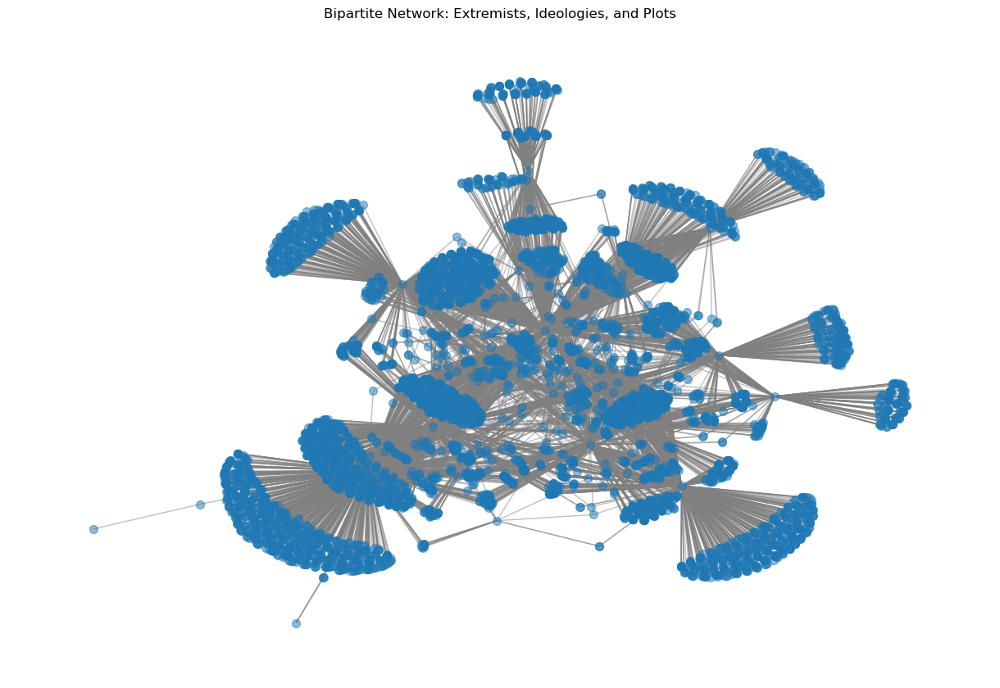


Bipartite network data saved successfully.


In [103]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from networkx.algorithms import bipartite

# **🔹 Step 1: Load Data**
df_pirus = data_previews["PIRUS V5"]
df_nodes = data_previews["SoNAR_Nodes"]

# Ensure IDs are in the correct format
df_pirus["Subject_ID"] = df_pirus["Subject_ID"].astype(str)
df_nodes["ID"] = df_nodes["ID"].astype(str)

# **🔹 Step 2: Merge PIRUS Data with SoNAR Nodes**
df_nodes_pirus = df_nodes.merge(df_pirus, left_on="ID", right_on="Subject_ID", how="left")

# **🔹 Step 3: Extract Extremists, Ideologies, and Plots**
bipartite_ideology_edges = df_nodes_pirus[["ID", "Ideology"]].dropna()

# Extract Plots (Individuals → Plot Targets)
plot_columns = ["Plot_Target1", "Plot_Target2", "Plot_Target3"]
df_nodes_pirus_melted = df_nodes_pirus.melt(id_vars=["ID"], value_vars=plot_columns, var_name="Plot_Type", value_name="Plot_Target")
bipartite_plot_edges = df_nodes_pirus_melted[["ID", "Plot_Target"]].dropna()

# **🔹 Step 4: Build the Three-Layer Bipartite Graph**
B = nx.Graph()

# Add individuals (Layer 1)
B.add_nodes_from(bipartite_ideology_edges["ID"], bipartite=0)

# Add ideologies (Layer 2)
B.add_nodes_from(bipartite_ideology_edges["Ideology"], bipartite=1)

# Add plots (Layer 3)
B.add_nodes_from(bipartite_plot_edges["Plot_Target"], bipartite=2)

# Add edges between individuals and their extremist ideology
for _, row in bipartite_ideology_edges.iterrows():
    B.add_edge(row["ID"], row["Ideology"])

# Add edges between individuals and the plots they were involved in
for _, row in bipartite_plot_edges.iterrows():
    B.add_edge(row["ID"], row["Plot_Target"])

print(f"\nBipartite Network Created: {len(B.nodes())} nodes, {len(B.edges())} edges.")

# **🔹 Step 5: Project the Bipartite Network onto a One-Mode Graph**
G_projection_ideology = bipartite.weighted_projected_graph(B, list(bipartite_ideology_edges["ID"]))
G_projection_plots = bipartite.weighted_projected_graph(B, list(bipartite_plot_edges["ID"]))

print(f"\nProjected Network of Extremists (based on Ideology): {len(G_projection_ideology.nodes())} nodes, {len(G_projection_ideology.edges())} edges.")
print(f"\nProjected Network of Extremists (based on Plots): {len(G_projection_plots.nodes())} nodes, {len(G_projection_plots.edges())} edges.")

# **🔹 Step 6: Visualize the Bipartite Network**
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(B, seed=42)
nx.draw(B, pos, node_size=50, edge_color="gray", alpha=0.5, with_labels=False)
plt.title("Bipartite Network: Extremists, Ideologies, and Plots")
plt.show()

# **🔹 Step 7: Save the Bipartite Network Data**
nx.write_edgelist(B, "bipartite_network_with_plots.edgelist")
nx.write_edgelist(G_projection_ideology, "projected_extremist_network_ideology.edgelist")
nx.write_edgelist(G_projection_plots, "projected_extremist_network_plots.edgelist")

print("\nBipartite network data saved successfully.")


### With Plots

In [105]:
import networkx as nx
import matplotlib.pyplot as plt

# **🔹 Step 1: Build the Bipartite Graph**
G_bipartite = nx.Graph()

# Add extremists (green circles) to one layer
extremists = set(df_top_extremists["ID"])
G_bipartite.add_nodes_from(extremists, bipartite=0)

# Add plots (pink squares) to the other layer
plots = set(df_top_extremists["Plot_Target"])
G_bipartite.add_nodes_from(plots, bipartite=1)

# Add edges (Extremist → Plot Target)
for _, row in df_top_extremists.iterrows():
    G_bipartite.add_edge(row["ID"], row["Plot_Target"])

# **🔹 Step 2: Create Mapping from Plot Numbers to Descriptions**
plot_target_map = {
    1: "Businesses", 2: "Government", 3: "Police", 4: "Military",
    5: "Abortion-related", 6: "Airports/Aircraft", 7: "Diplomatic Govt",
    8: "Educational Institution", 9: "Food/Water Supply", 10: "Media",
    11: "Maritime", 12: "NGOs", 13: "Other", 14: "Private Citizens",
    15: "Religious Institutions", 16: "Telecommunication", 
    17: "Terrorists/Non-State Militias", 18: "Tourists", 
    19: "Transportation", 20: "Utilities", -99: "Unknown", -88: "No Plot"
}

# Convert Plot_Target numbers to descriptions
df_top_extremists["Plot_Name"] = df_top_extremists["Plot_Target"].map(plot_target_map)

# **🔹 Step 3: Assign Colors & Labels for Visualization**
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_bipartite, seed=42)

# Draw extremists (green circles)
nx.draw_networkx_nodes(G_bipartite, pos, nodelist=extremists, node_color="green", node_shape="o", node_size=800, edgecolors="black", label="Extremists")

# Draw plots (pink squares) with updated labels
nx.draw_networkx_nodes(G_bipartite, pos, nodelist=plots, node_color="pink", node_shape="s", node_size=1500, edgecolors="black", label="Plots")
nx.draw_networkx_edges(G_bipartite, pos, alpha=0.5)

# Use descriptive labels for plots
plot_labels = {node: df_top_extremists.set_index("Plot_Target")["Plot_Name"].to_dict().get(node, str(node)) for node in plots}
extremist_labels = {node: str(node) for node in extremists}  # Keep extremists as IDs

# Combine both labels
all_labels = {**plot_labels, **extremist_labels}
nx.draw_networkx_labels(G_bipartite, pos, labels=all_labels, font_size=8)

plt.legend()
plt.title("Bipartite Graph: Top Extremists and Their Associated Plots (Labeled)")
plt.show()


NameError: name 'df_top_extremists' is not defined

C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_34464\1280485371.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



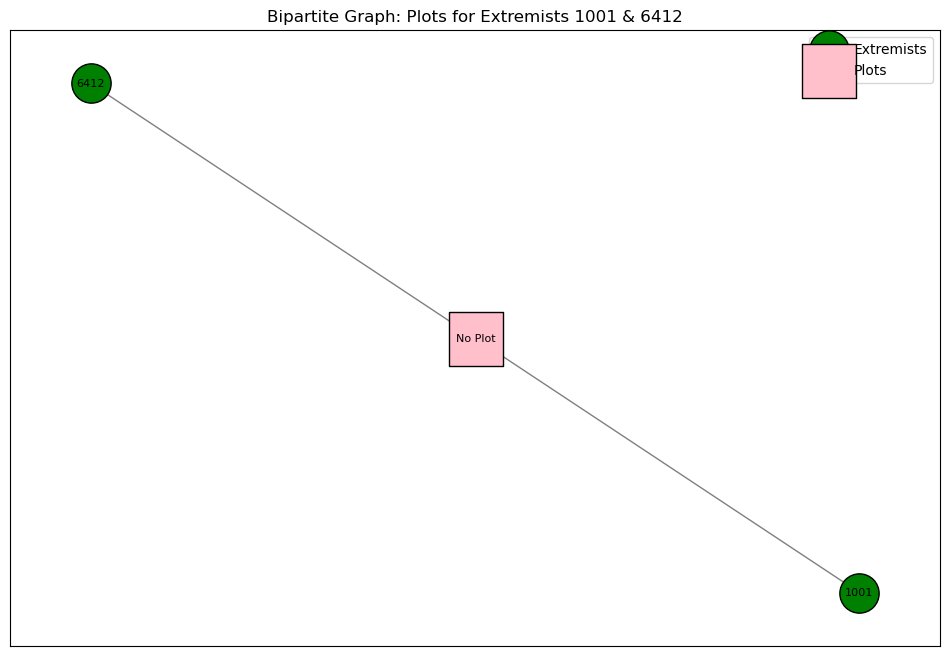

In [112]:
import networkx as nx
import matplotlib.pyplot as plt

# **🔹 Step 1: Filter Data for Specific Extremist IDs Using df_pirus**
selected_ids = ["1001", "6412"]
df_selected = df_pirus[df_pirus["Subject_ID"].isin(selected_ids)]

# **🔹 Step 2: Build the Bipartite Graph for the Selected Extremists**
G_bipartite = nx.Graph()

# Add extremists (green circles) using the Subject_ID column
extremists = set(df_selected["Subject_ID"])
G_bipartite.add_nodes_from(extremists, bipartite=0)

# Add plots (pink squares) using the Plot_Target1 column
plots = set(df_selected["Plot_Target1"])
G_bipartite.add_nodes_from(plots, bipartite=1)

# Add edges between each extremist and their plot target (Plot_Target1)
for _, row in df_selected.iterrows():
    G_bipartite.add_edge(row["Subject_ID"], row["Plot_Target1"])

# **🔹 Step 3: Create Mapping from Plot Numbers to Descriptions**
plot_target_map = {
    1: "Businesses", 2: "Government", 3: "Police", 4: "Military",
    5: "Abortion-related", 6: "Airports/Aircraft", 7: "Diplomatic Govt",
    8: "Educational Institution", 9: "Food/Water Supply", 10: "Media",
    11: "Maritime", 12: "NGOs", 13: "Other", 14: "Private Citizens",
    15: "Religious Institutions", 16: "Telecommunication", 
    17: "Terrorists/Non-State Militias", 18: "Tourists", 
    19: "Transportation", 20: "Utilities", -99: "Unknown", -88: "No Plot"
}

# Convert Plot_Target1 numbers to descriptive names in the filtered DataFrame
df_selected["Plot_Name"] = df_selected["Plot_Target1"].map(plot_target_map)

# **🔹 Step 4: Assign Colors & Labels for Visualization**
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_bipartite, seed=42)

# Draw extremists as green circles
nx.draw_networkx_nodes(G_bipartite, pos, nodelist=extremists,
                       node_color="green", node_shape="o",
                       node_size=800, edgecolors="black", label="Extremists")

# Draw plots as pink squares
nx.draw_networkx_nodes(G_bipartite, pos, nodelist=plots,
                       node_color="pink", node_shape="s",
                       node_size=1500, edgecolors="black", label="Plots")

nx.draw_networkx_edges(G_bipartite, pos, alpha=0.5)

# Create labels:
# Use descriptive labels for plot nodes (from Plot_Name)
plot_labels = {node: df_selected.set_index("Plot_Target1")["Plot_Name"].to_dict().get(node, str(node))
               for node in plots}
# Use the Subject_ID as labels for extremists
extremist_labels = {node: str(node) for node in extremists}

# Combine both label dictionaries
all_labels = {**plot_labels, **extremist_labels}
nx.draw_networkx_labels(G_bipartite, pos, labels=all_labels, font_size=8)

plt.legend()
plt.title("Bipartite Graph: Plots for Extremists 1001 & 6412")
plt.show()


C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_34464\1059873952.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



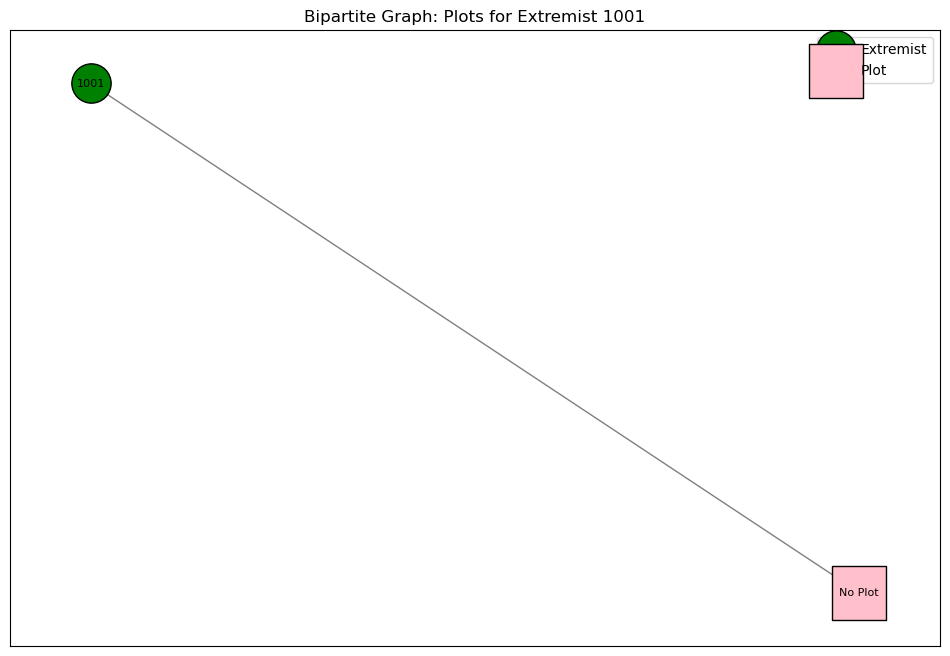

C:\Users\Pratyush Rohilla\AppData\Local\Temp\ipykernel_34464\1059873952.py:39: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



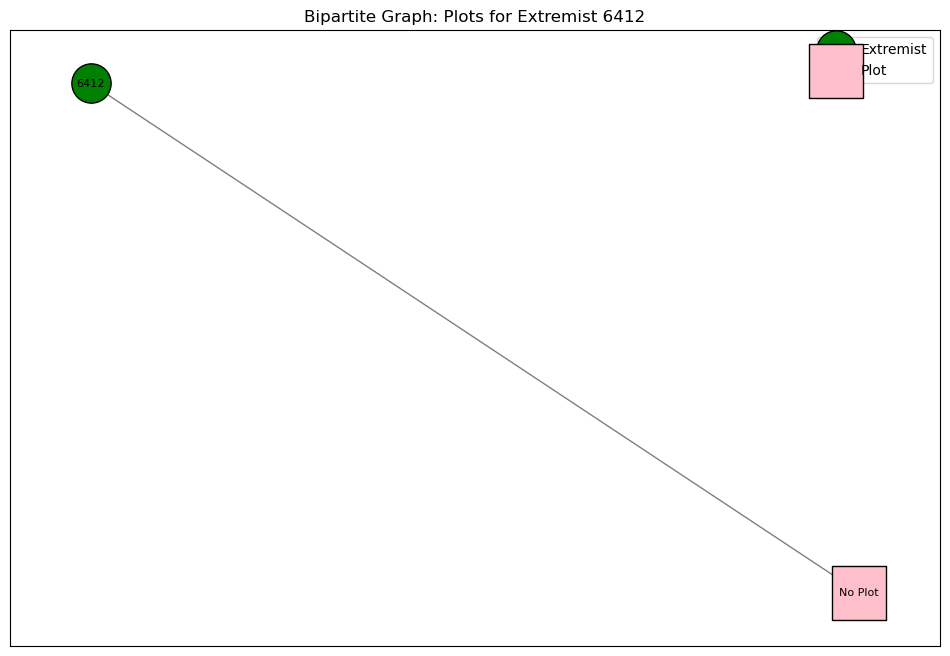

In [114]:
import networkx as nx
import matplotlib.pyplot as plt

# **🔹 Step 1: Define the Mapping from Plot Numbers to Descriptions**
plot_target_map = {
    1: "Businesses", 2: "Government", 3: "Police", 4: "Military",
    5: "Abortion-related", 6: "Airports/Aircraft", 7: "Diplomatic Govt",
    8: "Educational Institution", 9: "Food/Water Supply", 10: "Media",
    11: "Maritime", 12: "NGOs", 13: "Other", 14: "Private Citizens",
    15: "Religious Institutions", 16: "Telecommunication", 
    17: "Terrorists/Non-State Militias", 18: "Tourists", 
    19: "Transportation", 20: "Utilities", -99: "Unknown", -88: "No Plot"
}

# **🔹 Step 2: Specify the Extremist IDs for Separate Graphs**
selected_ids = ["1001", "6412"]

# **🔹 Step 3: Loop Over Each Extremist to Build and Visualize Their Bipartite Graph**
for extremist in selected_ids:
    # Filter df_pirus for the current extremist
    df_selected = df_pirus[df_pirus["Subject_ID"] == extremist]
    
    # Build the bipartite graph
    G_bipartite = nx.Graph()
    
    # Add extremist node (using Subject_ID)
    extremist_nodes = set(df_selected["Subject_ID"])
    G_bipartite.add_nodes_from(extremist_nodes, bipartite=0)
    
    # Add plot nodes (using Plot_Target1)
    plot_nodes = set(df_selected["Plot_Target1"])
    G_bipartite.add_nodes_from(plot_nodes, bipartite=1)
    
    # Add edges between the extremist and their plot targets
    for _, row in df_selected.iterrows():
        G_bipartite.add_edge(row["Subject_ID"], row["Plot_Target1"])
    
    # Map Plot_Target1 numbers to descriptive names in df_selected
    df_selected["Plot_Name"] = df_selected["Plot_Target1"].map(plot_target_map)
    
    # **🔹 Step 4: Visualize the Bipartite Graph**
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G_bipartite, seed=42)
    
    # Draw the extremist node (green circle)
    nx.draw_networkx_nodes(G_bipartite, pos, nodelist=extremist_nodes,
                           node_color="green", node_shape="o",
                           node_size=800, edgecolors="black", label="Extremist")
    
    # Draw the plot nodes (pink squares)
    nx.draw_networkx_nodes(G_bipartite, pos, nodelist=plot_nodes,
                           node_color="pink", node_shape="s",
                           node_size=1500, edgecolors="black", label="Plot")
    
    # Draw edges
    nx.draw_networkx_edges(G_bipartite, pos, alpha=0.5)
    
    # Create labels: use descriptive labels for plots and IDs for the extremist
    plot_labels = {node: df_selected.set_index("Plot_Target1")["Plot_Name"].to_dict().get(node, str(node))
                   for node in plot_nodes}
    extremist_labels = {node: str(node) for node in extremist_nodes}
    
    # Combine labels and draw them
    all_labels = {**plot_labels, **extremist_labels}
    nx.draw_networkx_labels(G_bipartite, pos, labels=all_labels, font_size=8)
    
    plt.legend()
    plt.title(f"Bipartite Graph: Plots for Extremist {extremist}")
    plt.show()


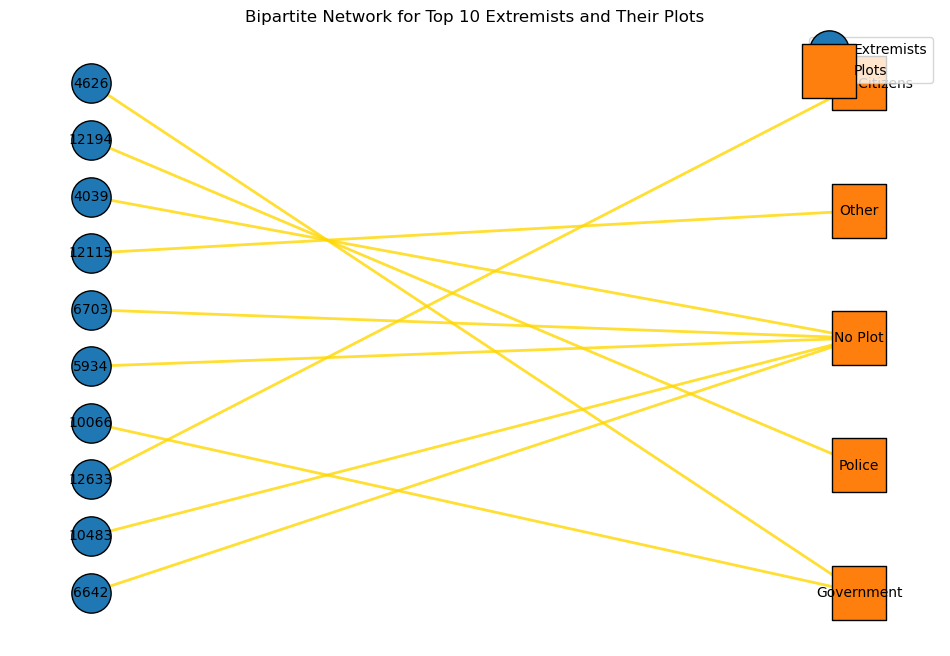

In [134]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

# ------------- Existing Steps -------------
# (We assume df_nodes_pirus is defined and contains "ID", "Plot_Target1", and "Ideology")

# Build the full bipartite graph using "Plot_Target1"
G_bipartite = nx.Graph()

# Add extremist nodes (bipartite attribute 0)
extremists = set(df_nodes_pirus["ID"])
G_bipartite.add_nodes_from(extremists, bipartite=0)

# Add plot nodes (bipartite attribute 1)
plots = set(df_nodes_pirus["Plot_Target1"].dropna())
G_bipartite.add_nodes_from(plots, bipartite=1)

# Add edges between extremists and plots
for _, row in df_nodes_pirus.iterrows():
    if pd.notnull(row["Plot_Target1"]):
        G_bipartite.add_edge(row["ID"], row["Plot_Target1"])

# Map plot numbers to descriptive names (optional, for later labeling)
plot_target_map = {
    1: "Businesses", 2: "Government", 3: "Police", 4: "Military",
    5: "Abortion-related", 6: "Airports/Aircraft", 7: "Diplomatic Govt",
    8: "Educational Institution", 9: "Food/Water Supply", 10: "Media",
    11: "Maritime", 12: "NGOs", 13: "Other", 14: "Private Citizens",
    15: "Religious Institutions", 16: "Telecommunication", 
    17: "Terrorists/Non-State Militias", 18: "Tourists", 
    19: "Transportation", 20: "Utilities", -99: "Unknown", -88: "No Plot"
}
df_nodes_pirus["Plot_Name"] = df_nodes_pirus["Plot_Target1"].map(plot_target_map)

# Assign ideology to extremist nodes
ideology_mapping = dict(zip(df_nodes_pirus["ID"], df_nodes_pirus["Ideology"]))
for node, data in G_bipartite.nodes(data=True):
    if data.get("bipartite") == 0:
        G_bipartite.nodes[node]["ideology"] = ideology_mapping.get(node, "Unknown")

# ------------- New Code: Plotting Top 10 Extremists -------------

# Select top 10 extremists by degree in the bipartite network
extremist_degrees = G_bipartite.degree(extremists)
# Sort extremists by degree (highest first) and take top 10
top_extremists = sorted(extremists, key=lambda n: G_bipartite.degree(n), reverse=True)[:10]

# Create a subgraph including the top 10 extremists and all plots they are connected to
nodes_to_include = set(top_extremists)
for n in top_extremists:
    nodes_to_include.update(G_bipartite.neighbors(n))
G_sub = G_bipartite.subgraph(nodes_to_include)

# For layout, we'll use the bipartite layout
# The bipartite layout requires the set of nodes in one partition, here the extremists.
pos = nx.bipartite_layout(G_sub, top_extremists)

# Define colors and shapes:
extremist_color = "#1f78b4"  # a coherent blue for extremists
plot_color = "#ff7f0e"       # a coherent orange for plot nodes
edge_color = "#FFD700"       # golden color for edges

# Separate nodes by type from the subgraph
sub_extremists = [n for n, d in G_sub.nodes(data=True) if d.get("bipartite") == 0]
sub_plots = [n for n, d in G_sub.nodes(data=True) if d.get("bipartite") == 1]

plt.figure(figsize=(12, 8))
# Draw extremist nodes as circles
nx.draw_networkx_nodes(G_sub, pos, nodelist=sub_extremists, node_color=extremist_color,
                       node_shape='o', node_size=800, edgecolors="black", label="Extremists")
# Draw plot nodes as squares
nx.draw_networkx_nodes(G_sub, pos, nodelist=sub_plots, node_color=plot_color,
                       node_shape='s', node_size=1500, edgecolors="black", label="Plots")
# Draw edges in golden color
nx.draw_networkx_edges(G_sub, pos, edge_color=edge_color, width=2, alpha=0.8)

# Optionally, add labels: use extremist IDs and for plots use descriptive names if available.
labels = {}
for n in sub_extremists:
    labels[n] = str(n)
for n in sub_plots:
    # Use the descriptive name if available; fallback to the node id
    labels[n] = df_nodes_pirus[df_nodes_pirus["Plot_Target1"] == n]["Plot_Name"].iloc[0] if not df_nodes_pirus[df_nodes_pirus["Plot_Target1"] == n].empty else str(n)

nx.draw_networkx_labels(G_sub, pos, labels, font_size=10)

plt.legend(scatterpoints=1)
plt.title("Bipartite Network for Top 10 Extremists and Their Plots")
plt.axis('off')
plt.show()


In [137]:
import networkx as nx
import pandas as pd
from collections import defaultdict

# ================================
# STEP 1: Build the Bipartite Network from df_nodes_pirus
# ================================
# We assume df_nodes_pirus has these columns:
# "ID" (extremist identifier), "Plot_Target1" (plot identifier), and "Ideology".

# Create an empty bipartite graph
G_bipartite = nx.Graph()

# Add extremist nodes (bipartite attribute 0)
extremists = set(df_nodes_pirus["ID"])
G_bipartite.add_nodes_from(extremists, bipartite=0)

# Add plot nodes (bipartite attribute 1) using the "Plot_Target1" column
plots = set(df_nodes_pirus["Plot_Target1"].dropna())
G_bipartite.add_nodes_from(plots, bipartite=1)

# Add edges between extremists and plots
for _, row in df_nodes_pirus.iterrows():
    if pd.notnull(row["Plot_Target1"]):
        G_bipartite.add_edge(row["ID"], row["Plot_Target1"])

# ================================
# STEP 2: Map Plot Numbers to Descriptive Names
# ================================
plot_target_map = {
    1: "Businesses", 2: "Government", 3: "Police", 4: "Military",
    5: "Abortion-related", 6: "Airports/Aircraft", 7: "Diplomatic Govt",
    8: "Educational Institution", 9: "Food/Water Supply", 10: "Media",
    11: "Maritime", 12: "NGOs", 13: "Other", 14: "Private Citizens",
    15: "Religious Institutions", 16: "Telecommunication", 
    17: "Terrorists/Non-State Militias", 18: "Tourists", 
    19: "Transportation", 20: "Utilities", -99: "Unknown", -88: "No Plot"
}

# Add a descriptive column in the DataFrame (optional)
df_nodes_pirus["Plot_Name"] = df_nodes_pirus["Plot_Target1"].map(plot_target_map)

# ================================
# STEP 3: Assign Ideology to Each Extremist Node
# ================================
# Create a mapping from extremist ID to their ideology.
ideology_mapping = dict(zip(df_nodes_pirus["ID"], df_nodes_pirus["Ideology"]))

# Add an "ideology" attribute to each extremist node (bipartite attribute 0)
for node, data in G_bipartite.nodes(data=True):
    if data.get("bipartite") == 0:
        G_bipartite.nodes[node]["ideology"] = ideology_mapping.get(node, "Unknown")

# ================================
# STEP 4: Determine Ideology Composition for Each Plot
# ================================
# For each plot, gather:
#   - The set of ideologies among connected extremists.
#   - The number of extremists connected to that plot.
plot_ideology_info = {}
plot_extremist_counts = {}

for plot in plots:
    # Get extremist neighbors for the plot
    extremist_neighbors = list(G_bipartite.neighbors(plot))
    # Count the number of extremists connected to this plot
    plot_extremist_counts[plot] = len(extremist_neighbors)
    # Collect their ideologies
    ideologies = set(G_bipartite.nodes[ext]["ideology"] for ext in extremist_neighbors)
    plot_ideology_info[plot] = ideologies

# Create a DataFrame to display the ideology composition and counts per plot
df_plot_info = pd.DataFrame([
    {
        "Plot": plot,
        "Plot_Description": plot_target_map.get(int(plot), str(plot)) if str(plot).isdigit() else str(plot),
        "Num_Extremists": plot_extremist_counts[plot],
        "Ideologies": plot_ideology_info[plot]
    }
    for plot in plot_extremist_counts
], columns=["Plot", "Plot_Description", "Num_Extremists", "Ideologies"])

# Sort the DataFrame by the number of extremists (descending) and take the top 10
df_top10_plots = df_plot_info.sort_values(by="Num_Extremists", ascending=False).head(10)

print("Top 10 Plots with the Most Extremists and Their Ideology Composition:")
print(df_top10_plots.to_string(index=False))


Top 10 Plots with the Most Extremists and Their Ideology Composition:
Plot       Plot_Description  Num_Extremists                                                                                                                                                                                                         Ideologies
 -88                    -88            1648 {Other, Environmental/Animal Rights, Black Nationalist/Separatist, Anti-Abortion, Conspiracy Theory, White Supremacist/Xenophobic, Jihadist, Militia/Sovereign Citizen/Anti-Government, Anarchist/Anti-Capitalist}
  14       Private Citizens             730 {Other, Environmental/Animal Rights, Black Nationalist/Separatist, Anti-Abortion, Conspiracy Theory, White Supremacist/Xenophobic, Jihadist, Militia/Sovereign Citizen/Anti-Government, Anarchist/Anti-Capitalist}
   2             Government             447                              {Other, Black Nationalist/Separatist, Anti-Abortion, Conspiracy Theory, White Supremacist/Xe

##### Ideologies: Includes groups such as Other, Black Nationalist/Separatist, Anti-Abortion, Conspiracy Theory, White Supremacist/Xenophobic, Jihadist, Militia/Sovereign Citizen/Anti-Government, and Anarchist/Anti-Capitalis